SyntaxError: invalid syntax (<ipython-input-1-ce48075e8c16>, line 1)

In [1]:
# Packages
import numpy as np
import pandas as pd
import seaborn as sn
import matplotlib.pyplot as plt
import datetime
#from All_data_muduo import df,f1
#//*** Use the whole window in the IPYNB editor
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

#//*** Maximize columns and rows displayed by pandas
# pd.set_option('display.max_rows', 1000)
# pd.set_option('display.max_columns',20 )

Look at Sparse PCA
https://scikit-learn.org/stable/modules/generated/sklearn.decomposition.SparsePCA.html

In [2]:
#df = pd.DataFrame(f2.todense(),index = f1["time"])

In [3]:
training_filepath = './data/training_amc_1min.pkl.zip'
df = pd.read_pickle(training_filepath)
df['time'] = pd.to_datetime(df['time'])


In [59]:
df


,time,open,high,low,close,volume,token,close_1,close_2,close_5,...,91,92,93,94,95,96,97,98,99,y
0,2019-07-24 09:00:00,4.090000,4.090000,4.090000,4.090000,406,"['index', 'fund', 'tracks', 'performance', 'st...",9.912903,9.922435,9.951029,...,1.870481e-02,-4.346574e-02,-4.597366e-02,4.393613e-02,-1.982158e-02,3.886423e-03,-4.084313e-03,4.691091e-02,-4.536256e-02,-0.586013
1,2019-07-24 09:31:00,9.846181,9.912903,9.846181,9.912903,23448,[],9.922435,9.998688,10.037386,...,-3.622445e-15,2.604610e-15,3.638883e-15,-5.773362e-15,1.815679e-17,7.997190e-15,-8.216557e-16,4.425338e-15,5.004656e-15,-0.005040
2,2019-07-24 09:32:00,9.922435,9.951029,9.922435,9.922435,3394,[],9.998688,9.960561,10.103536,...,6.840537e-15,7.925148e-15,-6.897774e-15,5.217240e-15,9.536418e-15,1.094964e-15,6.264581e-15,5.849719e-15,8.439549e-15,-0.003861
3,2019-07-24 09:33:00,9.939591,9.998688,9.935302,9.998688,24294,[],9.960561,9.951029,10.103536,...,7.555619e-15,1.125621e-15,6.131435e-15,-8.294358e-15,2.983305e-15,2.607483e-14,8.351052e-15,-2.340860e-14,-1.577746e-14,0.000395
4,2019-07-24 09:34:00,10.003453,10.017751,9.874776,9.960561,67195,[],9.951029,10.037386,10.046346,...,1.553265e-17,-2.274470e-15,-5.351744e-16,-5.854387e-15,1.059291e-14,-9.265511e-16,5.714436e-15,-5.036118e-15,3.599688e-16,0.000153
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
305093,2021-07-12 19:56:00,41.250000,41.290000,41.220000,41.290000,10274,[],41.330000,41.250000,NaN,...,0.000000e+00,0.000000e+00,0.000000e+00,-0.000000e+00,-0.000000e+00,-0.000000e+00,-0.000000e+00,0.000000e+00,0.000000e+00,-0.000908
305094,2021-07-12 19:57:00,41.270000,41.350000,41.250000,41.330000,6832,[],41.250000,41.250000,NaN,...,0.000000e+00,0.000000e+00,0.000000e+00,-0.000000e+00,-0.000000e+00,-0.000000e+00,-0.000000e+00,0.000000e+00,0.000000e+00,0.000242
305095,2021-07-12 19:58:00,41.330000,41.330000,41.250000,41.250000,14056,[],41.250000,41.280000,NaN,...,0.000000e+00,0.000000e+00,0.000000e+00,-0.000000e+00,-0.000000e+00,-0.000000e+00,-0.000000e+00,0.000000e+00,0.000000e+00,0.000788
305096,2021-07-12 19:59:00,41.250000,41.280000,41.250000,41.250000,8974,[],41.280000,NaN,NaN,...,0.000000e+00,0.000000e+00,0.000000e+00,-0.000000e+00,-0.000000e+00,-0.000000e+00,-0.000000e+00,0.000000e+00,0.000000e+00,-0.000545


In [5]:
import time
from sklearn.neural_network import MLPRegressor
from sklearn.model_selection import cross_val_score
from sklearn import metrics
from sklearn.metrics import mean_squared_error
from math import sqrt
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import r2_score

#//*** Define the Prediction (Target) Column
predict_col = 'close_5'

#//*** Build a list of the PCA Columns
pca_cols = list(df.columns[17:])
stock_cols = ['close','volume']
train_cols = stock_cols + pca_cols




In [9]:

x_train = df[train_cols][:1000]
y_train = df[predict_col][:1000]
x_test = df[train_cols][1001:1100]
y_test = df[predict_col][1001:1100]

start_time = time.time()
print("Regressing")
regr = MLPRegressor(max_iter=500).fit(x_train,y_train)
#scores = cross_val_score(regr, x_train, y_train, cv=5)
print(f"Complete: {round(time.time()-start_time,2)}" )
#//*** Score the model
score = regr.score(x_train, y_train)
result = regr.predict(x_test)

mse = mean_squared_error(y_test, result)

#//*** Root Mean squared Error
rmse = sqrt(mse)

print(rmse)
print(result)

Regressing
Complete: 1.44
3.5757442669887367
[ 7.29975959  8.30222585  9.18098526  9.06573065  7.66043147  7.57721183
  9.08888353  9.07093016  9.26886743  9.22863415  8.93876652  9.20304735
  8.96844888  9.17860163  9.34913735  9.16442892  4.05870619  8.91793935
  9.26499402  8.4801485   9.3702591   3.89168815  8.2484987   9.29763609
  9.2800136   9.07042583  9.09884653  9.28465771  9.02889951  8.77165132
  9.24374258  7.51768223  3.89167704  9.10633     8.66593708  9.2219324
  9.16828655  9.31845028  8.2510882   9.33117811  4.18714899  8.87354923
  8.04985708  9.05936241  8.65752366  9.32062749  3.94329044  9.36714714
  4.26343863  9.21596588  9.34335143  9.28072695  9.23411707  9.1932498
  8.80308894  8.63301831  3.93028135  6.79548266 -3.85417123  9.2576812
  9.33728513  9.019889    9.13106224  9.01826448  9.11561787  9.27740133
  8.16376968  8.71343793  9.30093864  8.33508932  9.28673589  9.34315306
  9.38120379  2.9644516   9.29262282  9.33047476  8.73492245  9.29123518
  9.18702

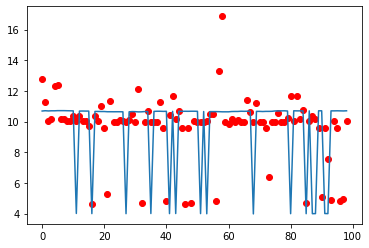

In [8]:
display_size = 40

fig,ax = plt.subplots()
plot_x = np.arange(len(y_test))
ax.plot(plot_x,y_test )
ax.scatter(plot_x,result,color='red' )


    #plt.legend(loc='upper right',bbox_to_anchor=(1.35, 1.2))
plt.show()

In [52]:
results_df = pd.DataFrame(columns=['target','rmse','r2','start','end','predict_range','model_time','actual','predict'])

Notes on Normalization: https://stackoverflow.com/questions/62131266/mlpregressor-working-but-results-dont-make-any-sense

Regressing
Complete: 6.04s


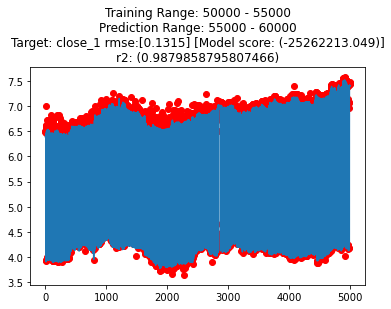

Regressing
Complete: 5.75s


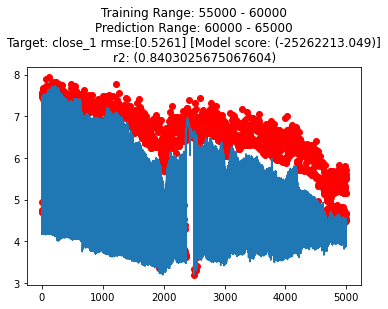

Regressing
Complete: 16.71s


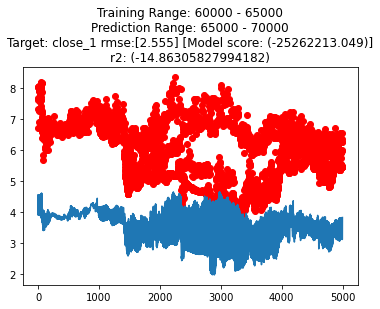

Regressing
Complete: 5.48s


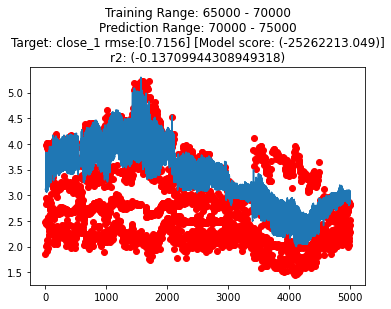

Regressing
Complete: 3.13s


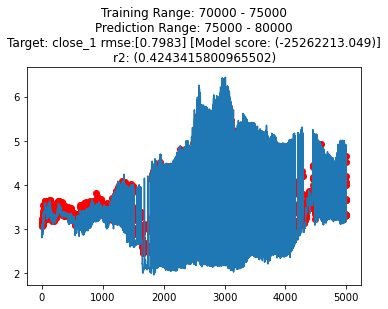

Regressing
Complete: 8.18s


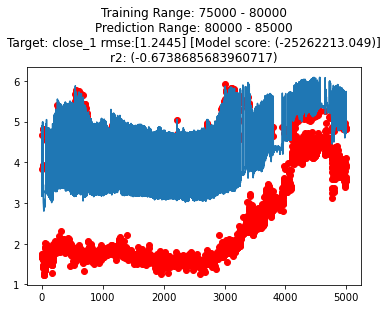

Regressing
Complete: 6.04s


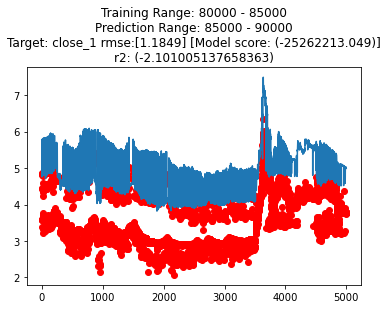

Regressing
Complete: 4.9s


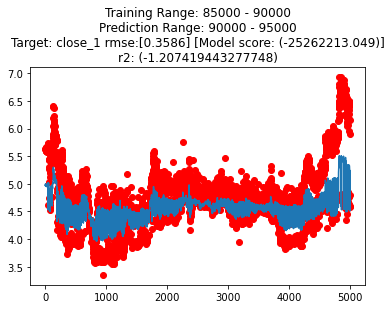

Regressing
Complete: 5.12s


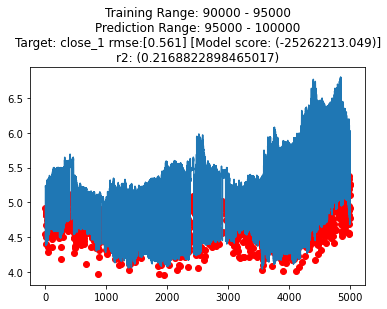

Regressing
Complete: 4.36s


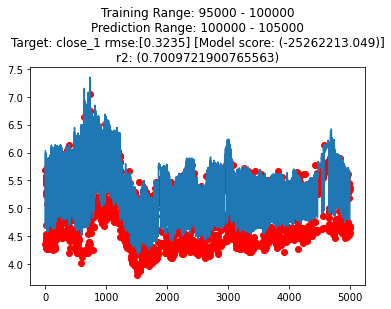

Regressing
Complete: 4.98s


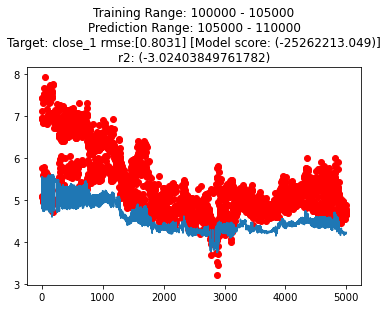

Regressing
Complete: 2.66s


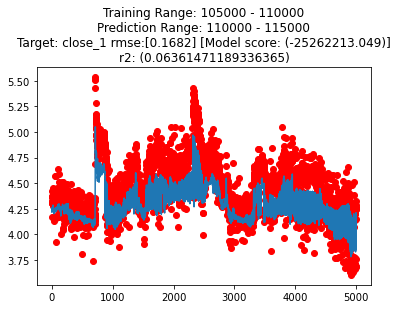

Regressing
Complete: 5.3s


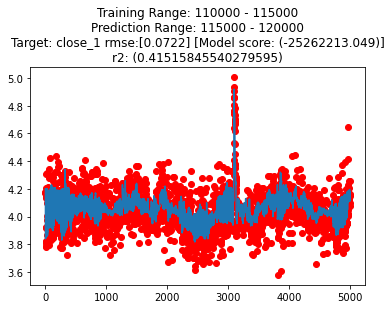

Regressing
Complete: 2.78s


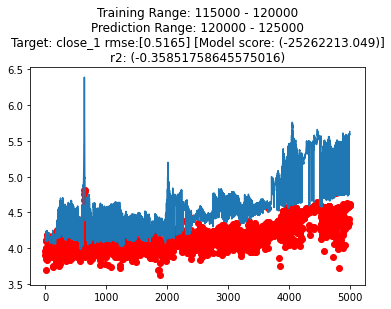

Regressing
Complete: 3.48s


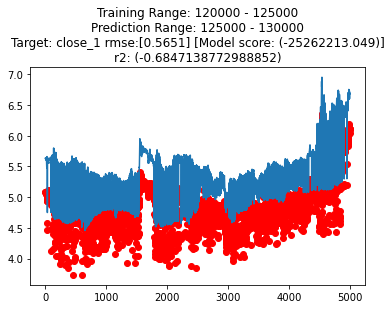

Regressing
Complete: 3.32s


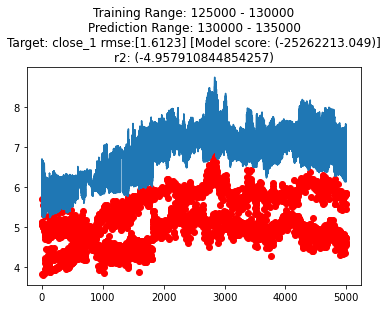

Regressing
Complete: 4.77s


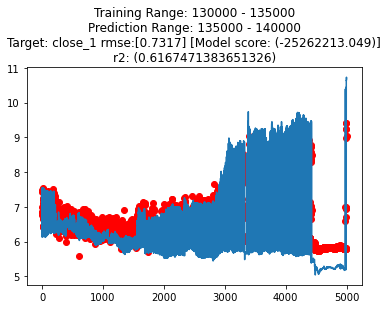

Regressing
Complete: 12.99s


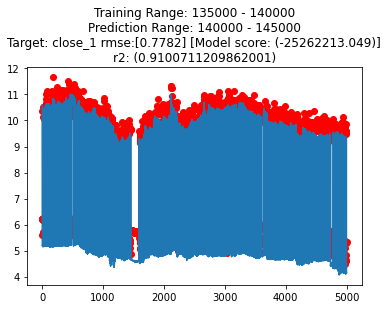

Regressing
Complete: 12.11s


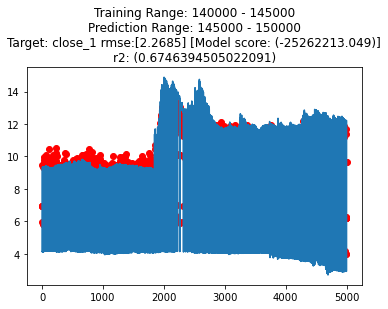

Regressing
Complete: 25.42s


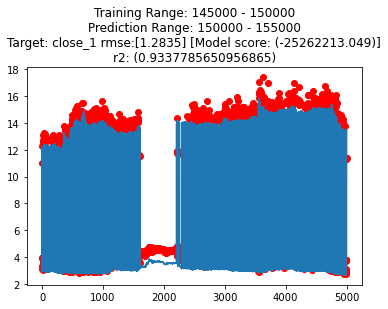

Regressing
Complete: 8.17s


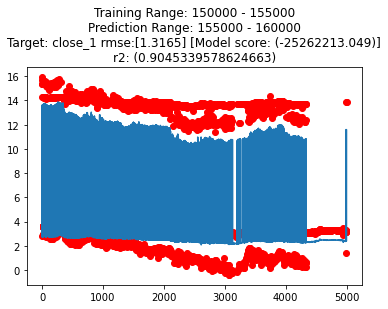

Regressing
Complete: 10.87s


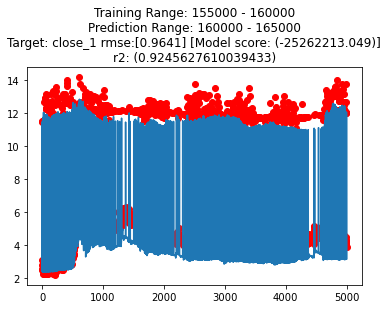

Regressing
Complete: 11.92s


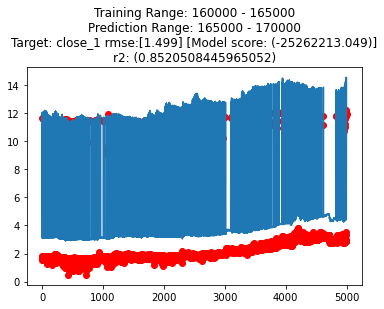

Regressing
Complete: 12.14s


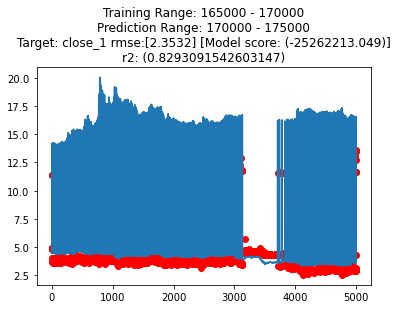

Regressing
Complete: 11.07s


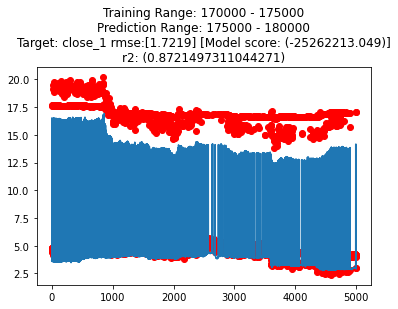

Regressing
Complete: 12.34s


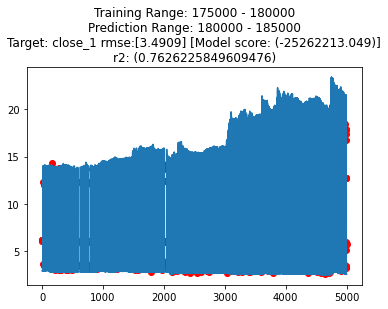

Regressing
Complete: 10.79s


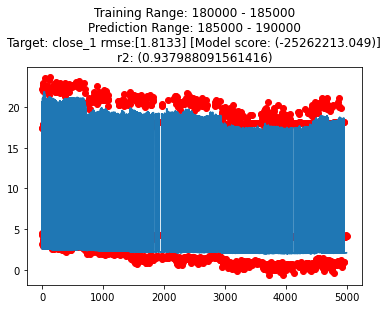

Regressing
Complete: 16.79s


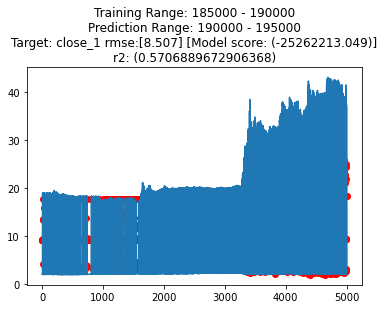

Regressing
Complete: 14.18s


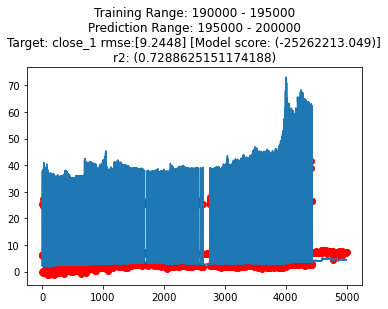

Regressing
Complete: 33.28s


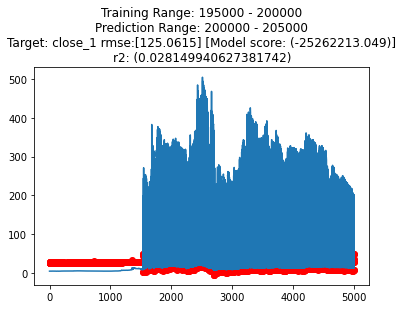

Regressing
Complete: 46.28s


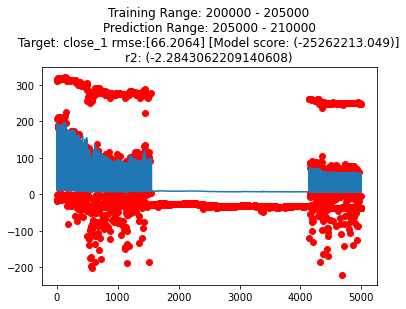

Regressing
Complete: 19.62s


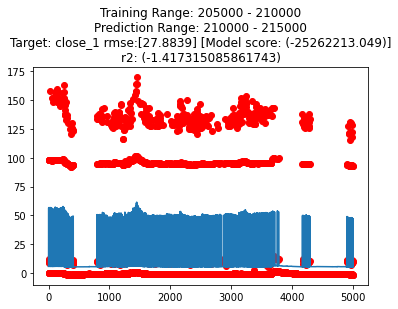

Regressing
Complete: 17.54s


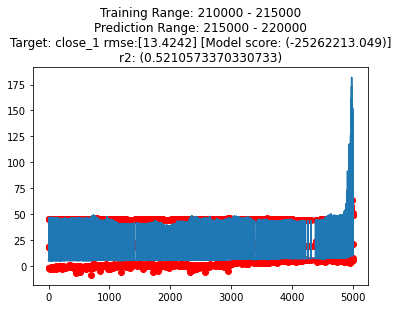

Regressing
Complete: 22.93s


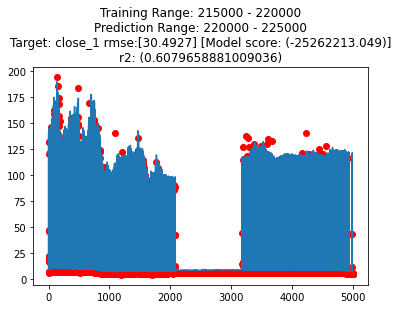

Regressing
Complete: 38.46s


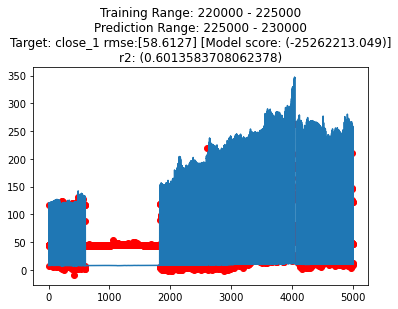

Regressing
Complete: 83.43s


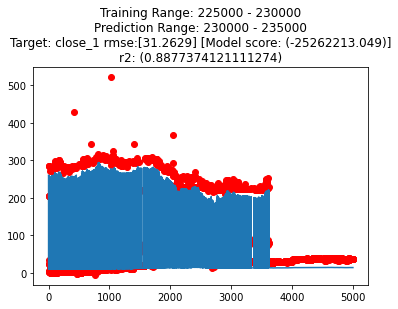

Regressing
Complete: 82.08s


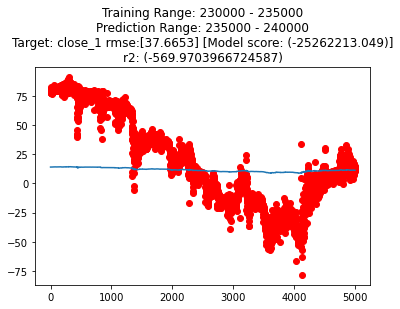

Regressing
Complete: 5.8s


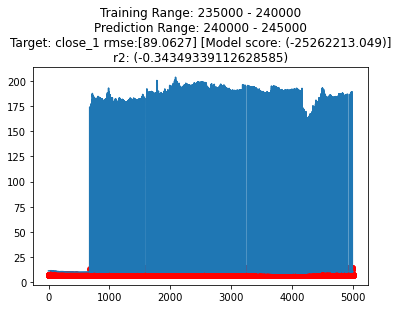

Regressing
Complete: 65.06s


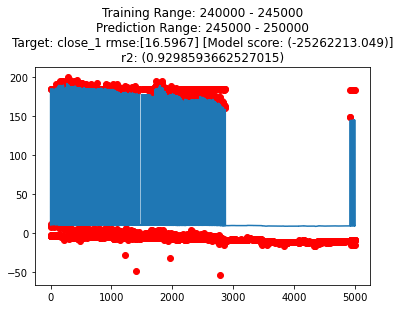

Regressing
Complete: 39.21s


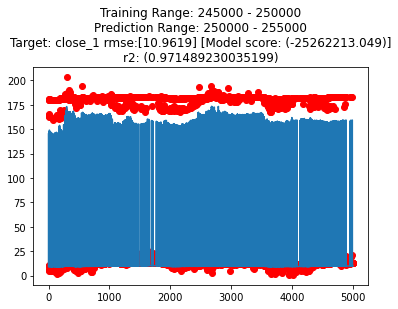

Regressing
Complete: 55.42s


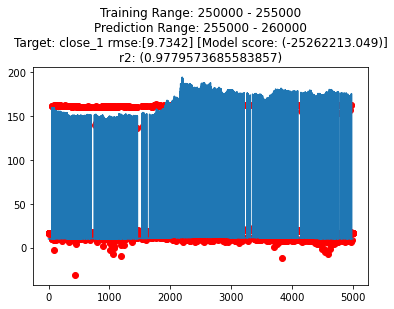

Regressing
Complete: 28.32s


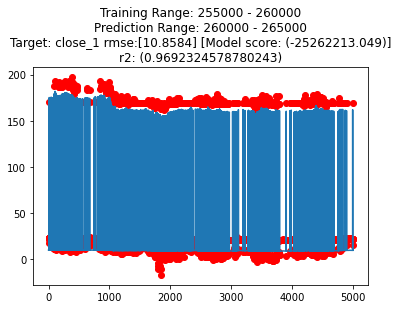

Regressing
Complete: 41.04s


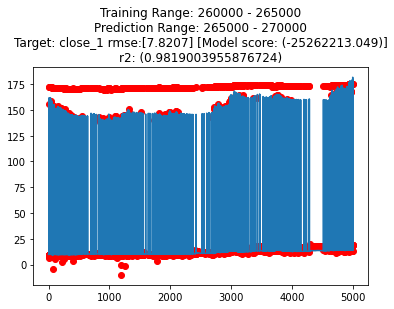

Regressing
Complete: 48.92s


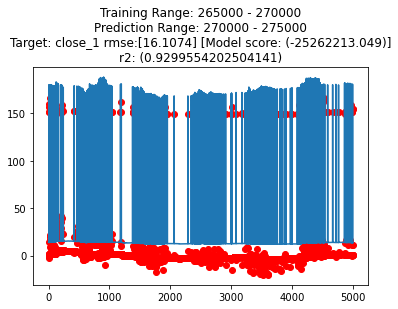

Regressing
Complete: 45.44s


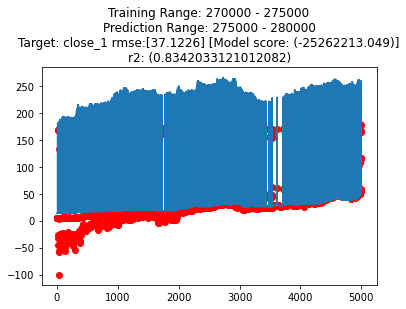

Regressing
Complete: 66.81s


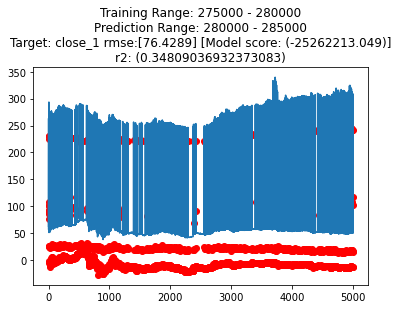

Regressing
Complete: 75.98s


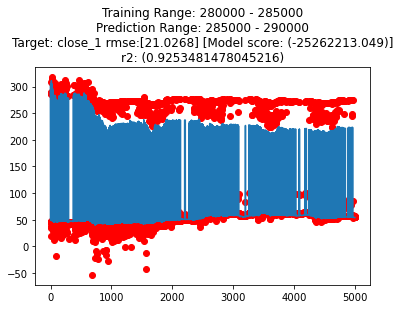

Regressing
Complete: 57.84s


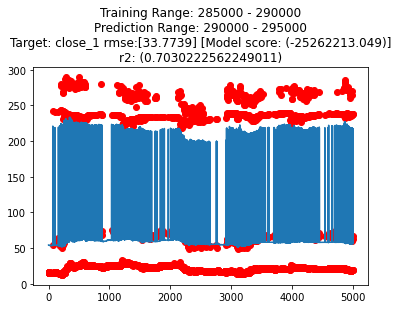

Regressing
Complete: 35.36s


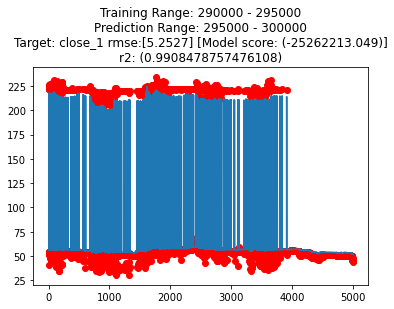

Regressing
Complete: 37.87s


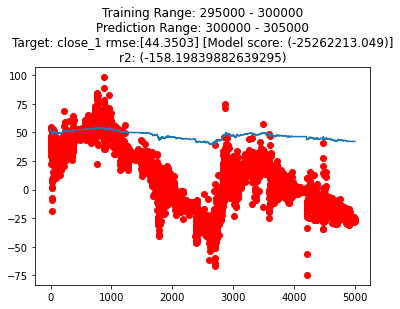

Regressing
Complete: 4.49s


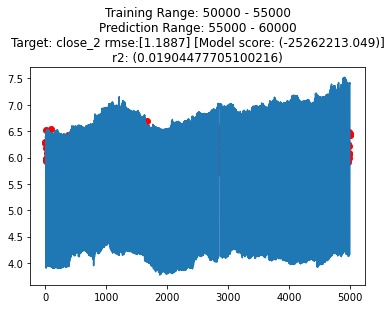

Regressing
Complete: 5.95s


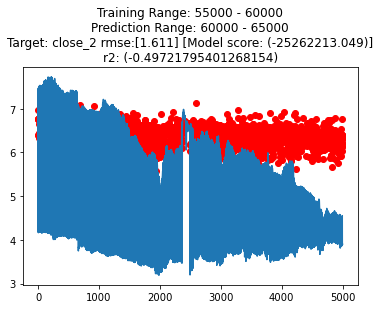

Regressing
Complete: 9.89s


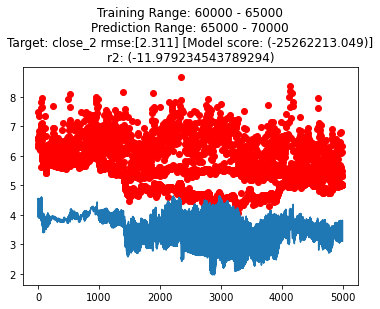

Regressing
Complete: 6.45s


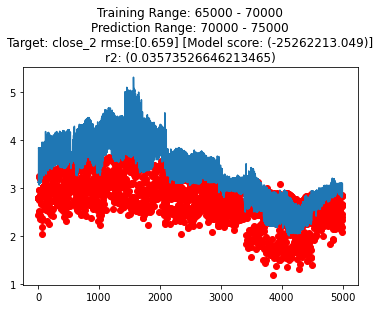

Regressing
Complete: 6.25s


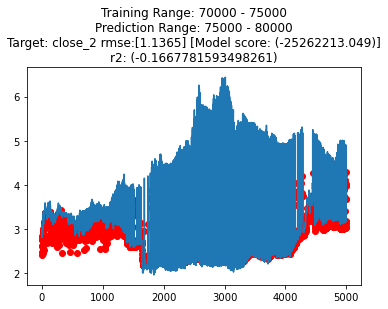

Regressing
Complete: 6.82s


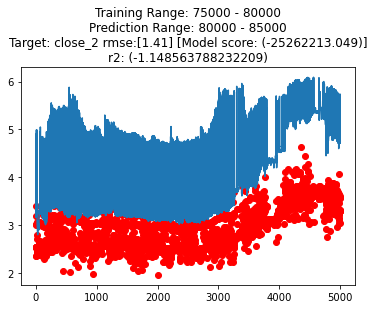

Regressing
Complete: 5.77s


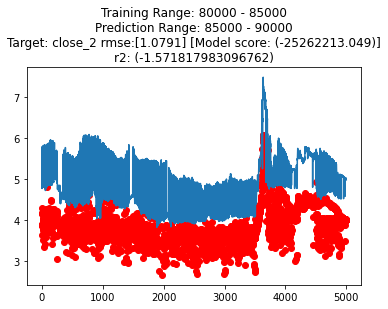

Regressing
Complete: 4.21s


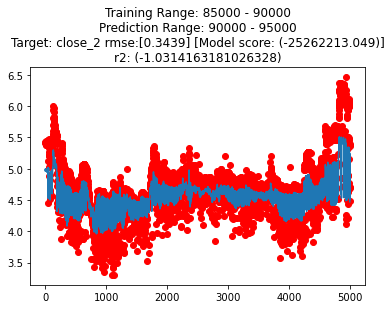

Regressing
Complete: 3.26s


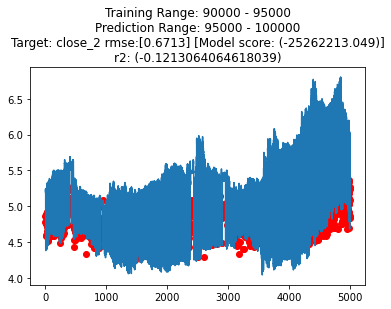

Regressing
Complete: 5.94s


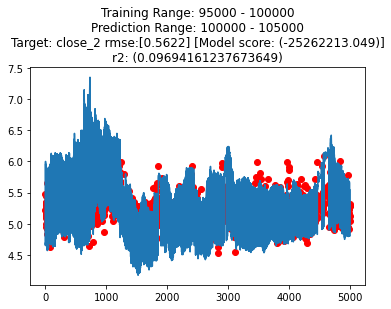

Regressing
Complete: 4.77s


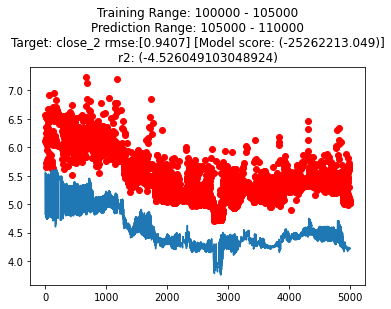

Regressing
Complete: 4.03s


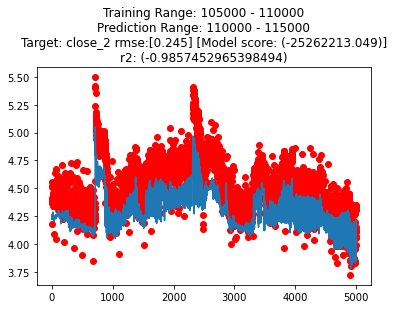

Regressing
Complete: 2.62s


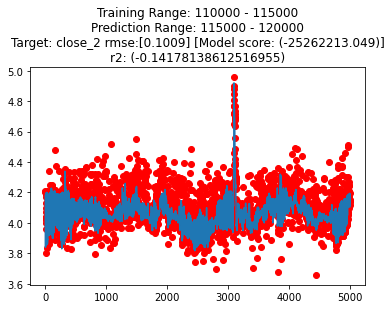

Regressing
Complete: 0.91s


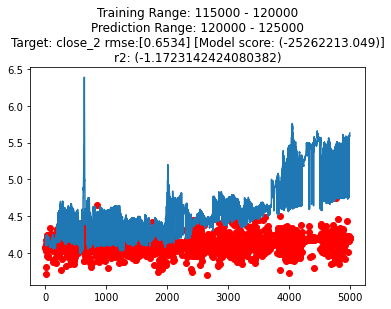

Regressing
Complete: 3.34s


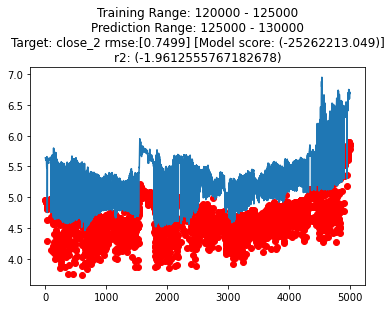

Regressing
Complete: 5.14s


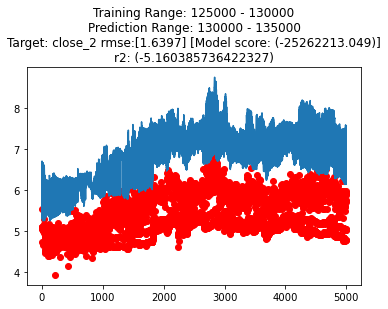

Regressing
Complete: 5.92s


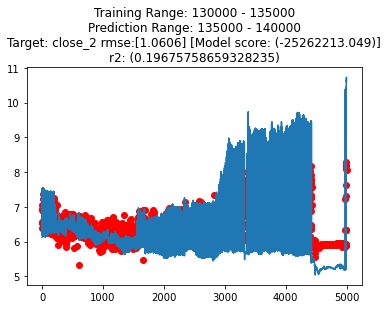

Regressing
Complete: 5.5s


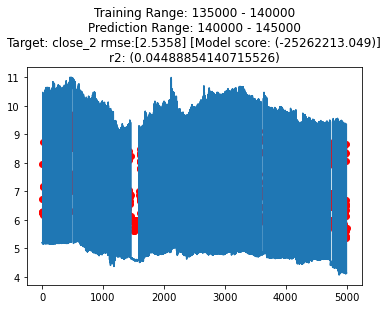

Regressing
Complete: 6.86s


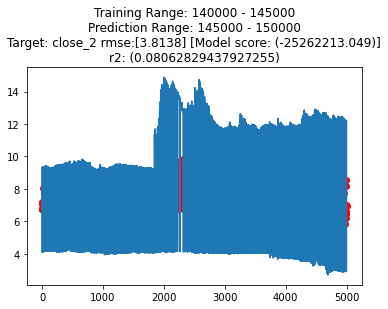

Regressing
Complete: 7.27s


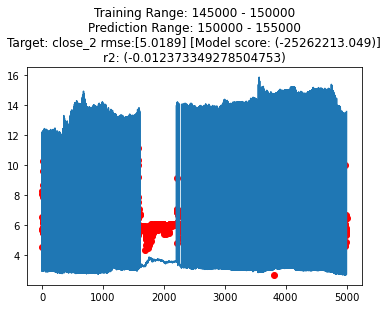

Regressing
Complete: 8.42s


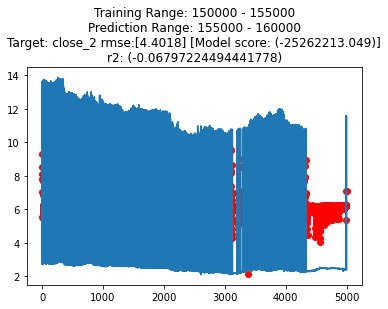

Regressing
Complete: 24.63s


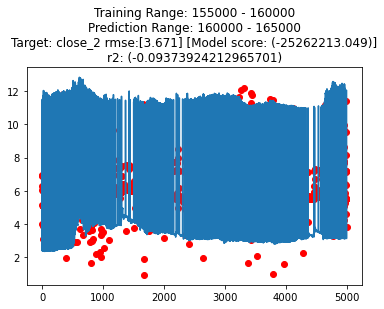

Regressing
Complete: 6.52s


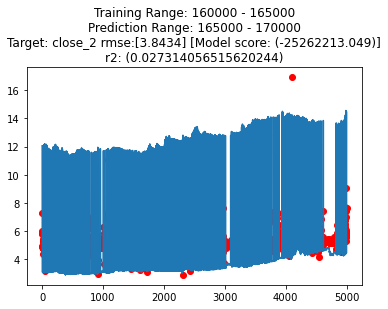

Regressing
Complete: 6.1s


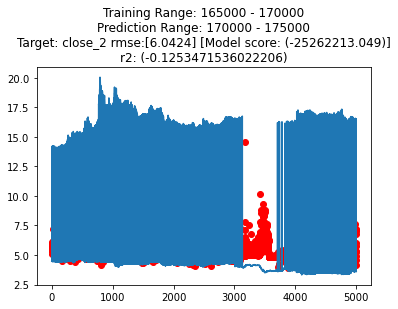

Regressing
Complete: 6.58s


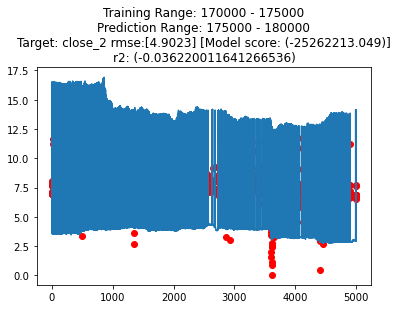

Regressing
Complete: 5.52s


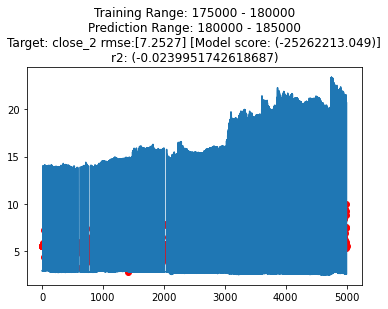

Regressing
Complete: 10.31s


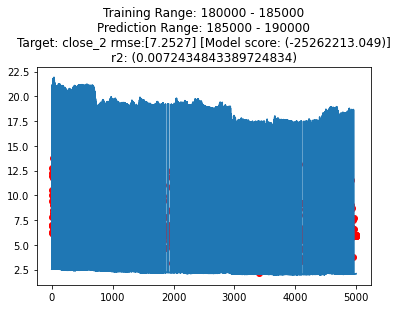

Regressing
Complete: 10.28s


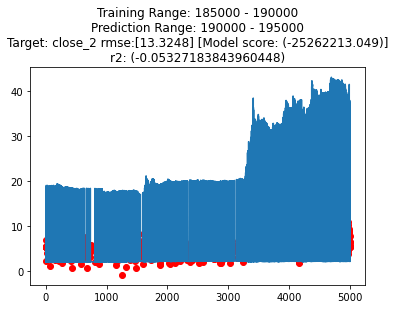

Regressing
Complete: 14.51s


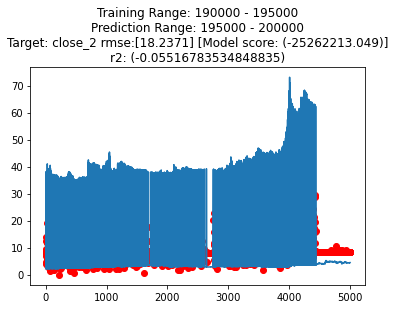

Regressing
Complete: 11.85s


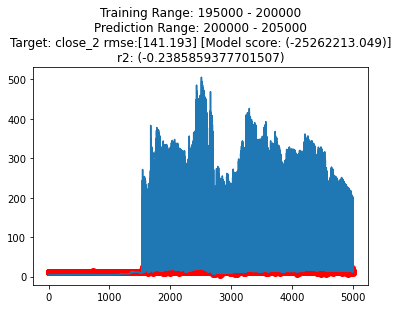

Regressing
Complete: 28.05s


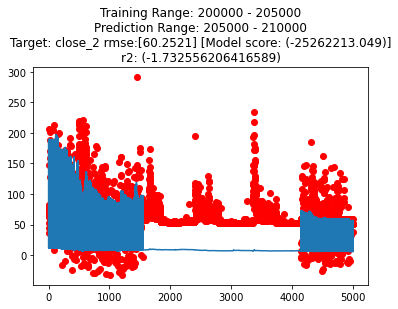

Regressing
Complete: 14.82s


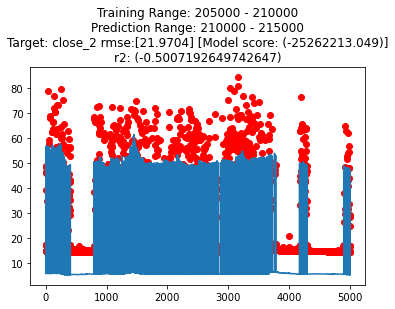

Regressing
Complete: 30.16s


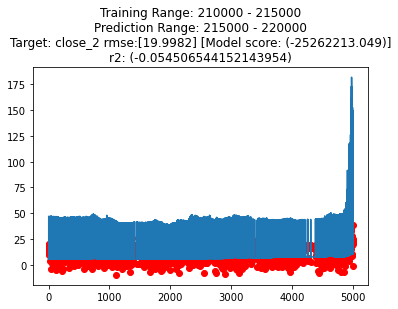

Regressing
Complete: 17.32s


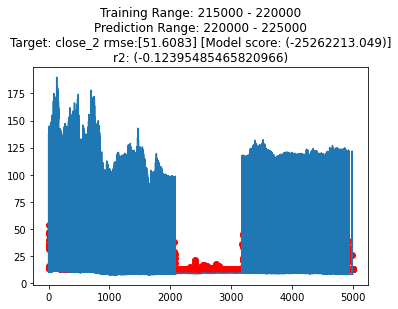

Regressing
Complete: 13.21s


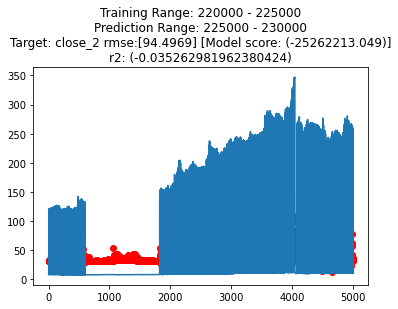

Regressing
Complete: 21.17s


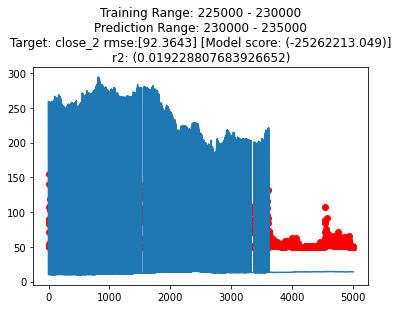

Regressing
Complete: 15.09s


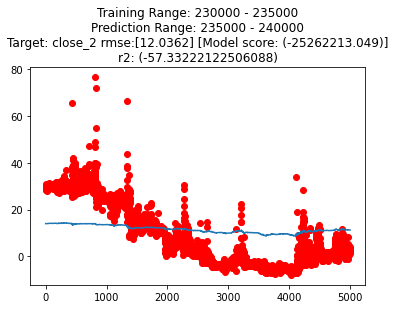

Regressing
Complete: 6.39s


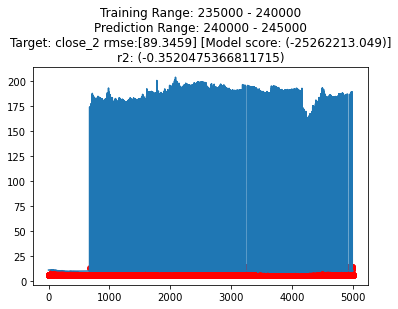

Regressing
Complete: 24.24s


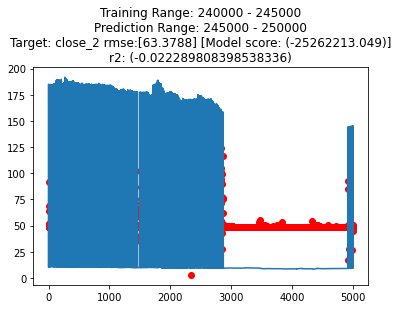

Regressing
Complete: 19.65s


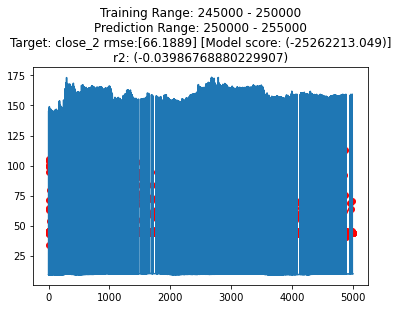

Regressing
Complete: 17.91s


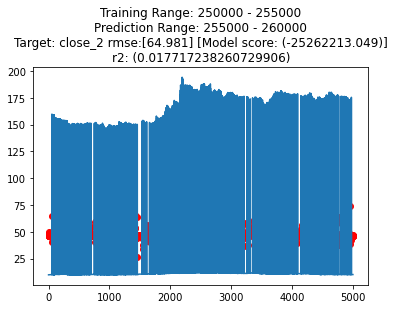

Regressing
Complete: 20.22s


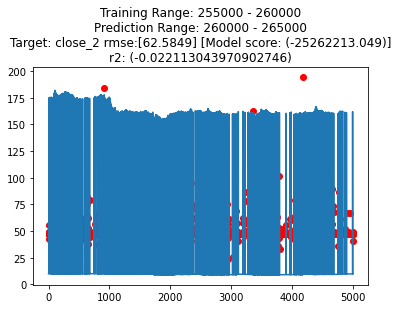

Regressing
Complete: 21.21s


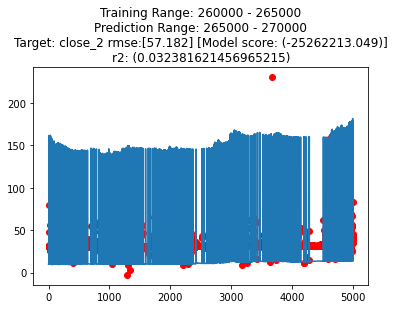

Regressing
Complete: 16.21s


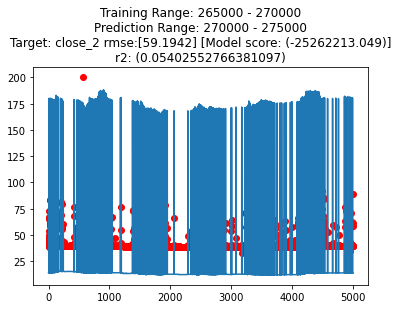

Regressing
Complete: 16.18s


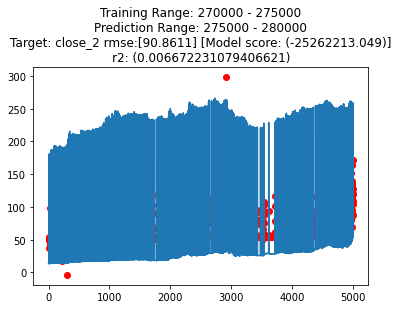

Regressing
Complete: 16.5s


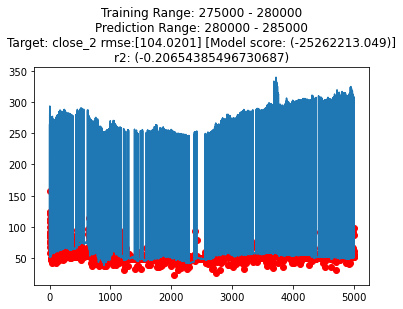

Regressing
Complete: 21.57s


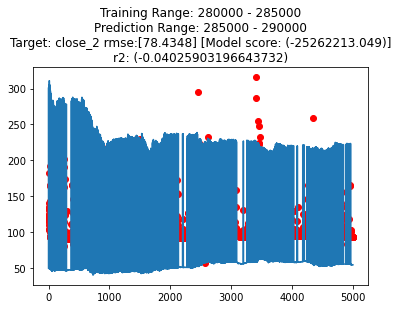

Regressing
Complete: 24.13s


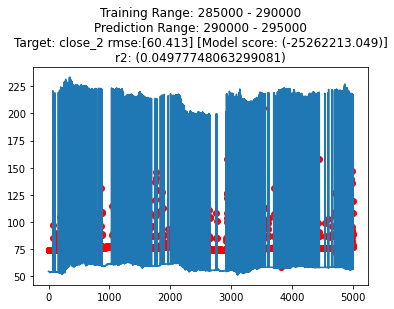

Regressing
Complete: 21.43s


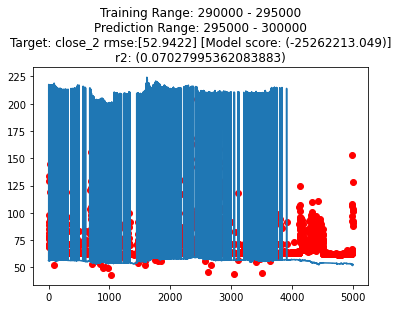

Regressing
Complete: 25.45s


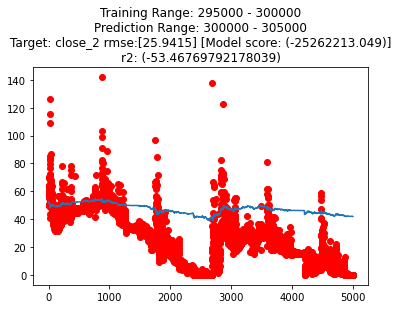

Regressing
Complete: 10.11s


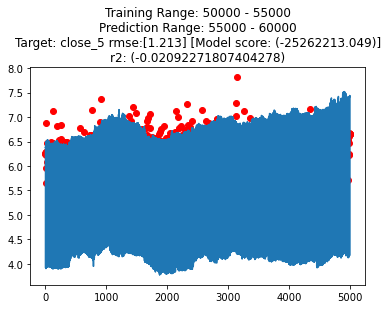

Regressing
Complete: 3.86s


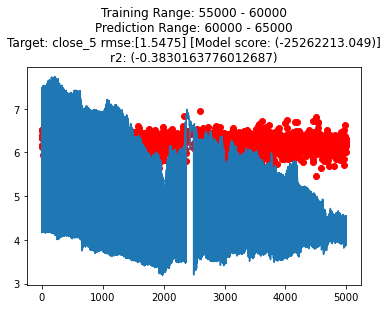

Regressing
Complete: 7.7s


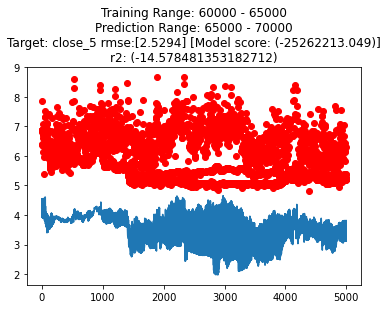

Regressing
Complete: 6.14s


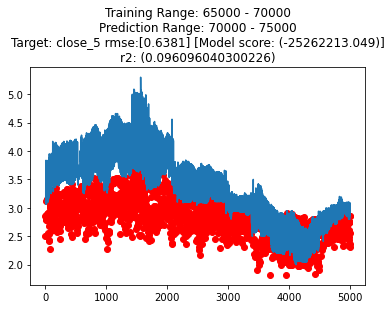

Regressing
Complete: 4.07s


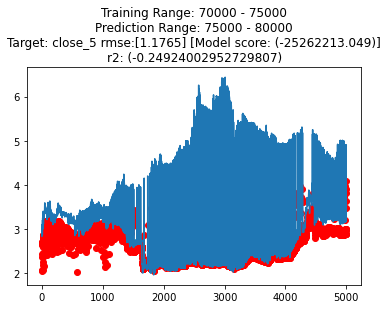

Regressing
Complete: 5.4s


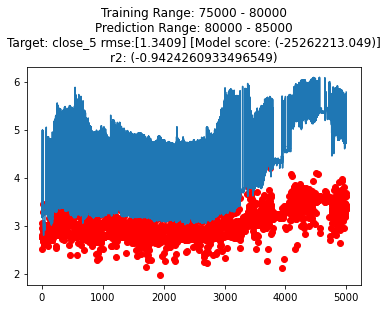

Regressing
Complete: 11.29s


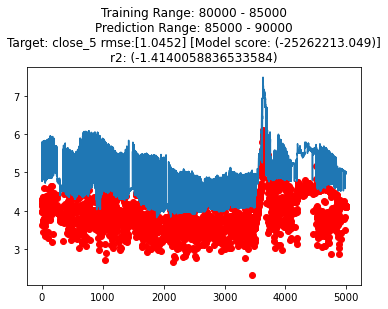

Regressing
Complete: 6.53s


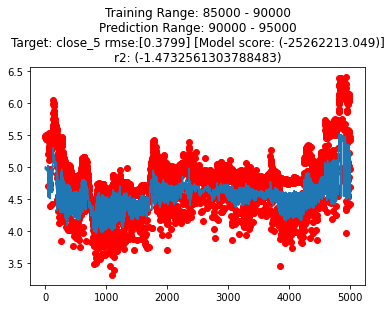

Regressing
Complete: 5.08s


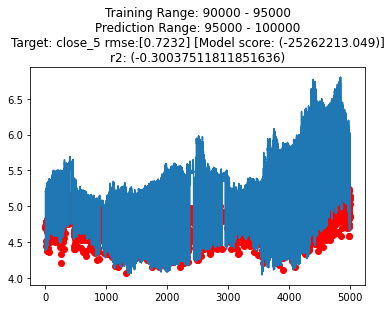

Regressing
Complete: 8.69s


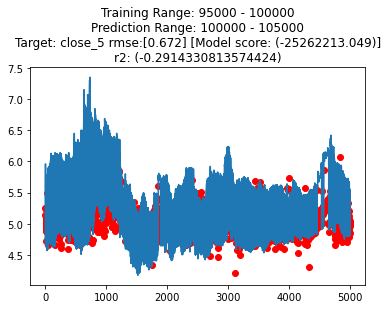

Regressing
Complete: 11.87s


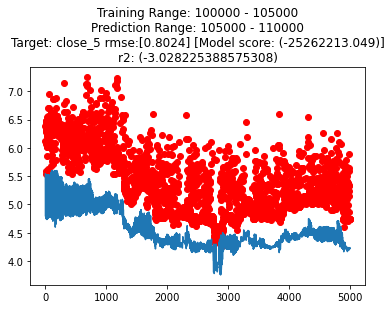

Regressing
Complete: 2.83s


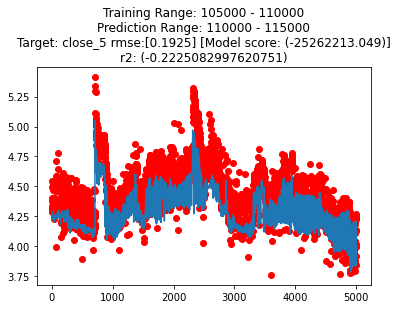

Regressing
Complete: 2.86s


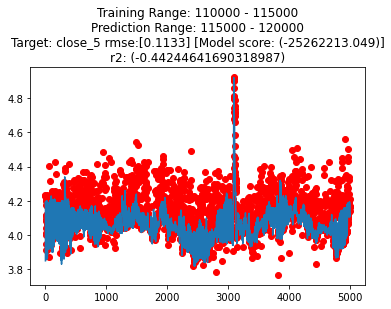

Regressing
Complete: 0.89s


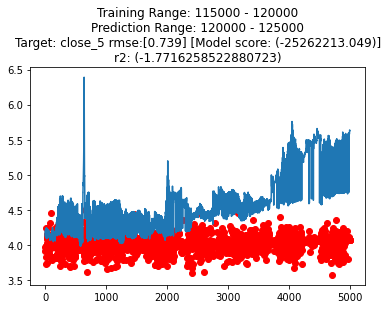

Regressing
Complete: 4.71s


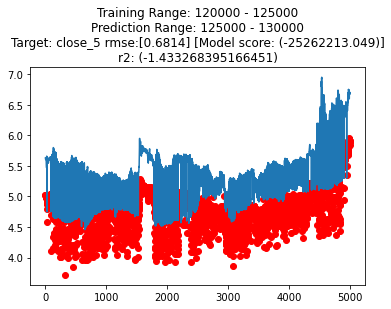

Regressing
Complete: 4.98s


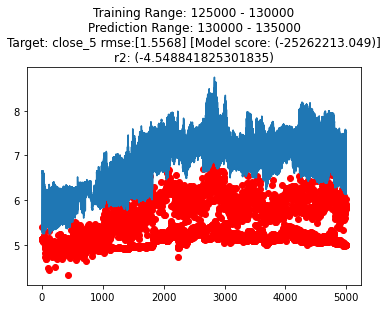

Regressing
Complete: 5.11s


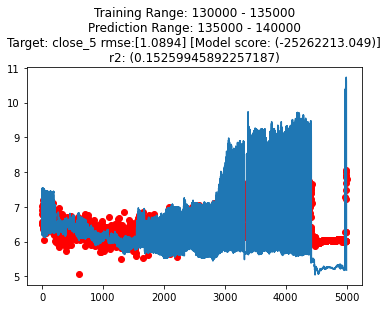

Regressing
Complete: 9.13s


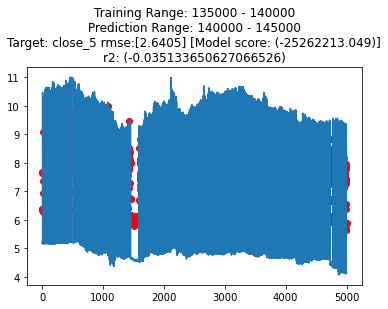

Regressing
Complete: 6.06s


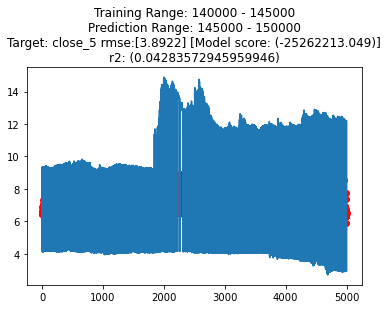

Regressing
Complete: 32.93s


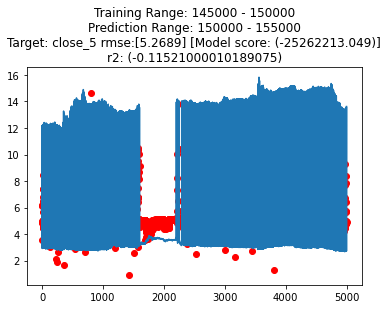

Regressing
Complete: 7.6s


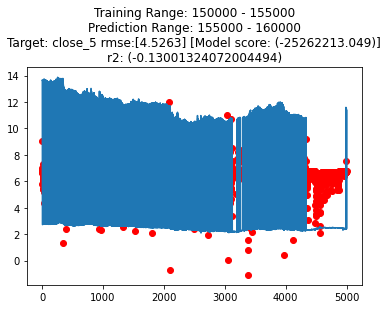

Regressing
Complete: 2.97s


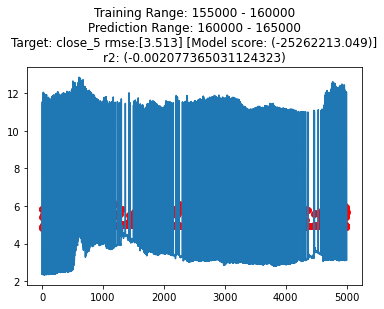

Regressing
Complete: 8.82s


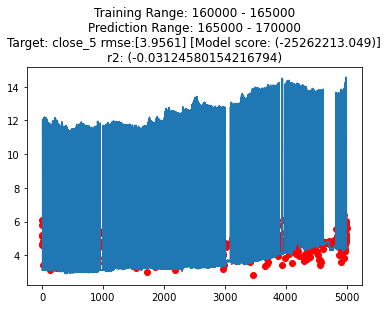

Regressing
Complete: 8.5s


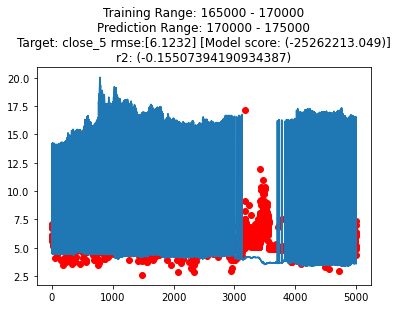

Regressing
Complete: 8.57s


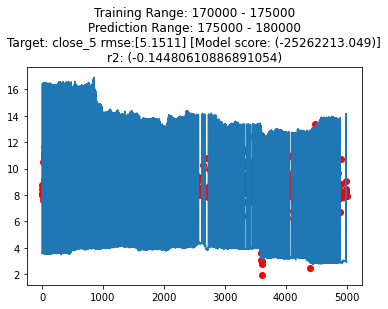

Regressing
Complete: 7.1s


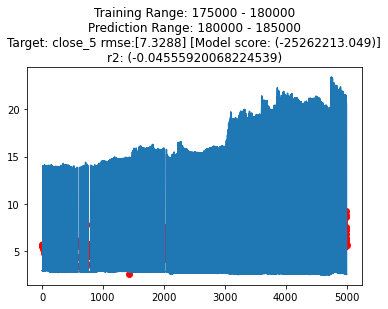

Regressing
Complete: 5.05s


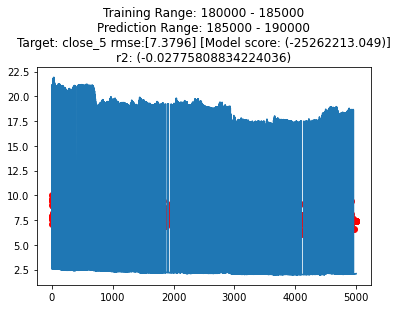

Regressing
Complete: 36.58s


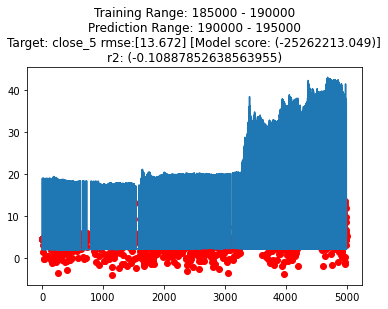

Regressing
Complete: 52.96s


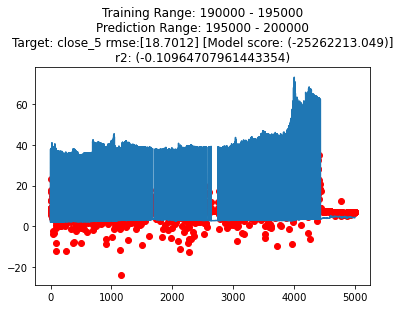

Regressing
Complete: 11.78s


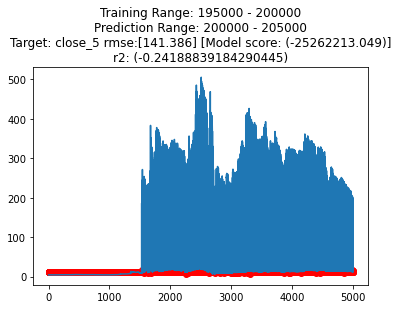

Regressing
Complete: 28.9s


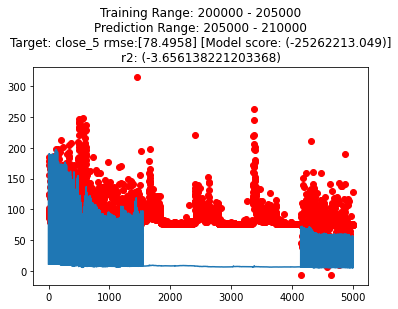

Regressing
Complete: 17.12s


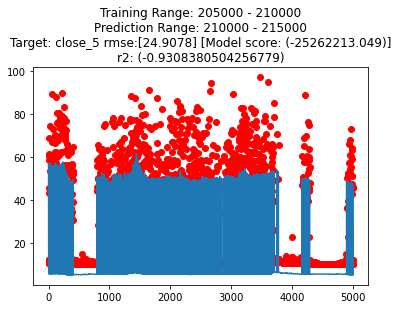

Regressing
Complete: 19.33s


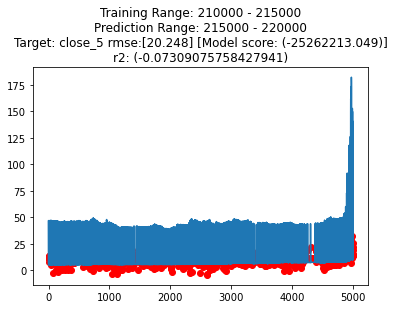

Regressing
Complete: 11.22s


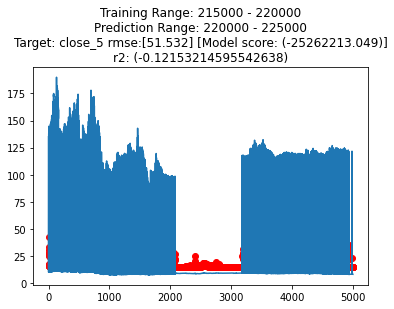

Regressing
Complete: 18.61s


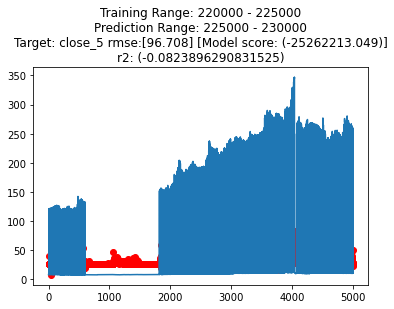

Regressing
Complete: 26.01s


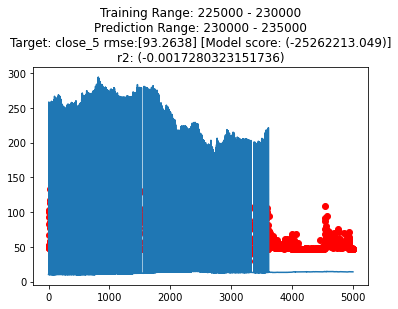

Regressing
Complete: 21.44s


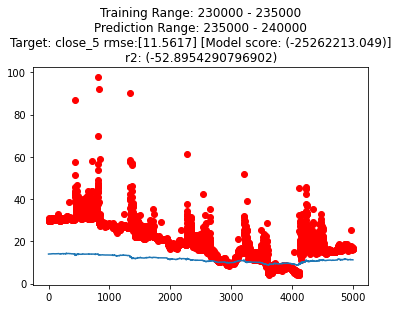

Regressing
Complete: 7.29s


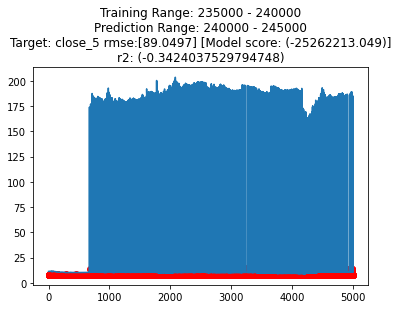

Regressing
Complete: 23.77s


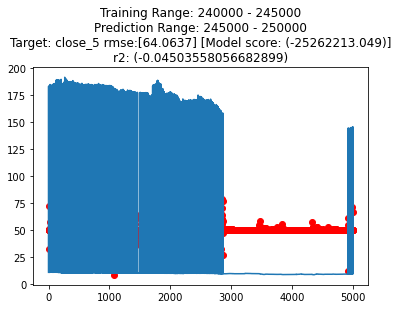

Regressing
Complete: 22.51s


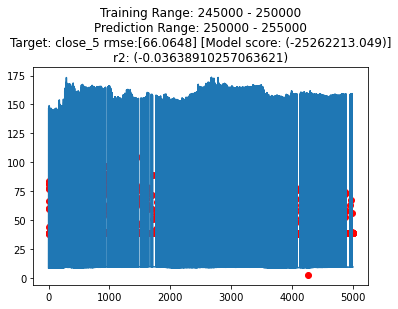

Regressing
Complete: 22.88s


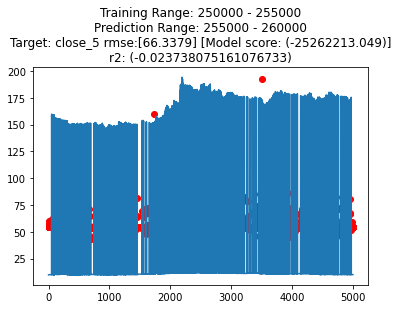

Regressing
Complete: 24.32s


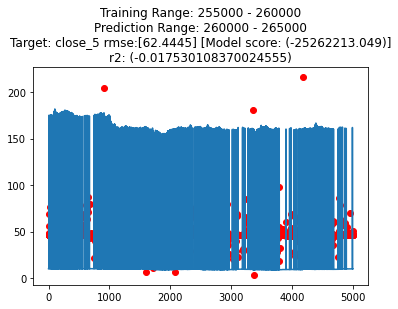

Regressing
Complete: 20.71s


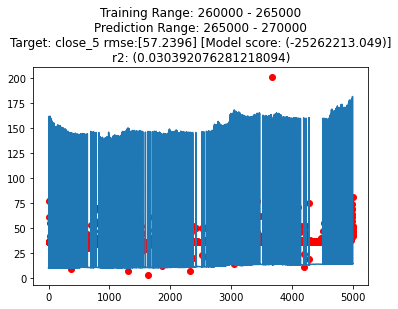

Regressing
Complete: 23.61s


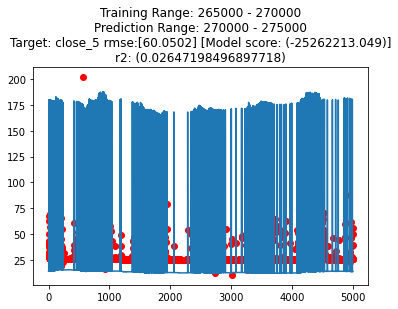

Regressing
Complete: 31.99s


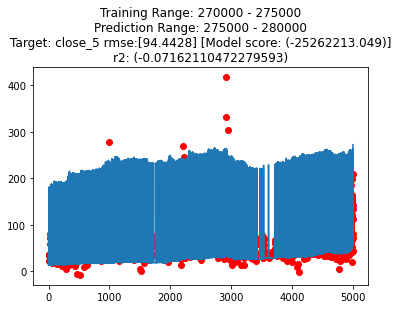

Regressing
Complete: 27.7s


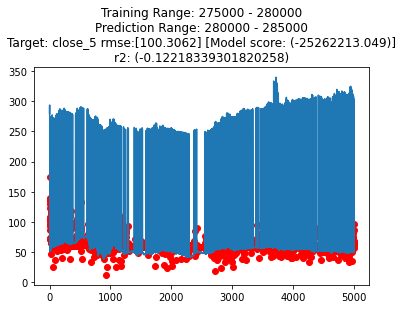

Regressing
Complete: 22.63s


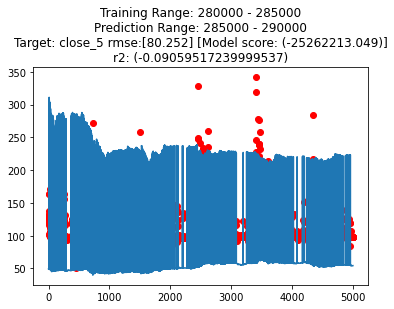

Regressing
Complete: 22.45s


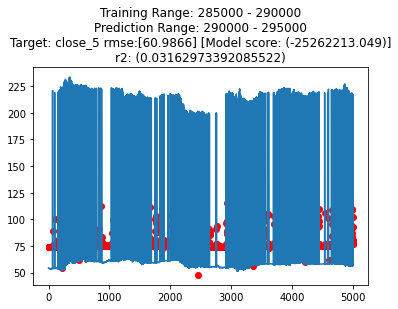

Regressing
Complete: 34.85s


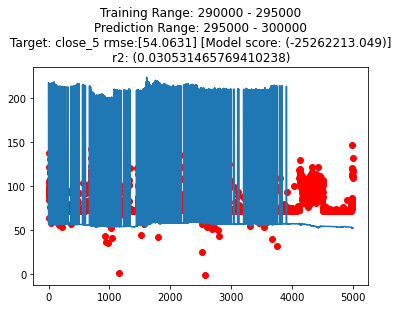

Regressing
Complete: 25.8s


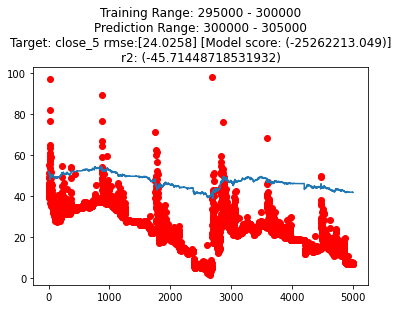

Regressing
Complete: 4.32s


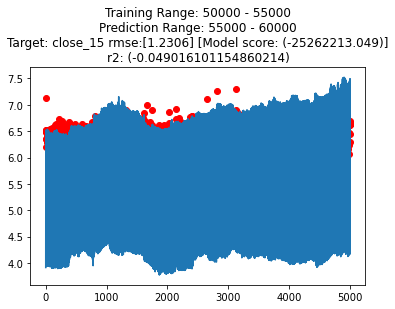

Regressing
Complete: 8.23s


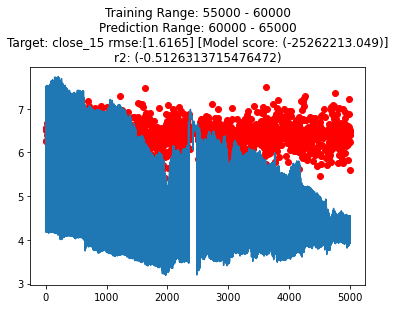

Regressing
Complete: 8.5s


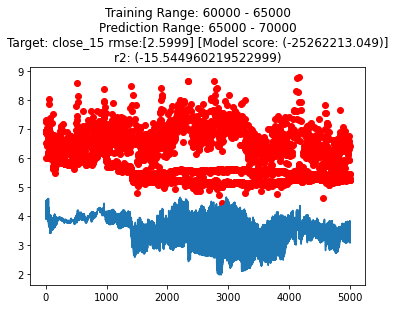

Regressing
Complete: 5.72s


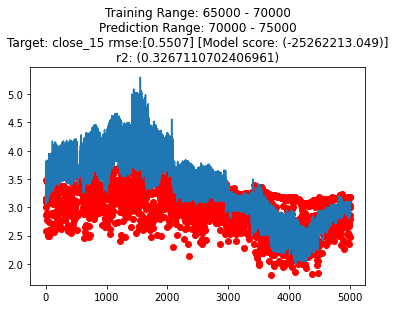

Regressing
Complete: 3.53s


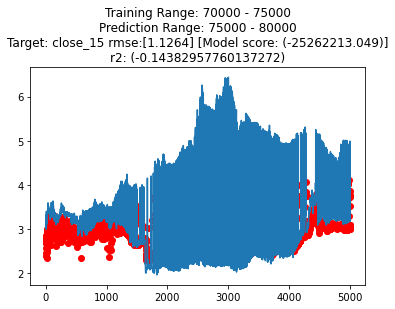

Regressing
Complete: 15.52s


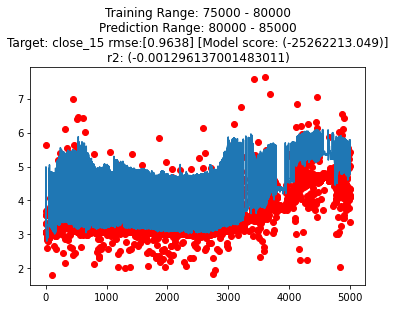

Regressing
Complete: 6.44s


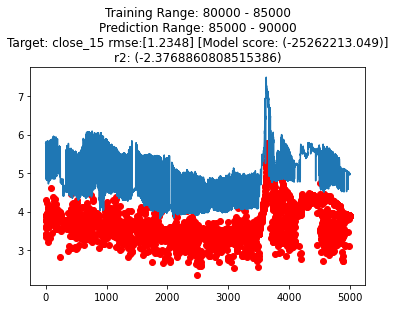

Regressing
Complete: 7.88s


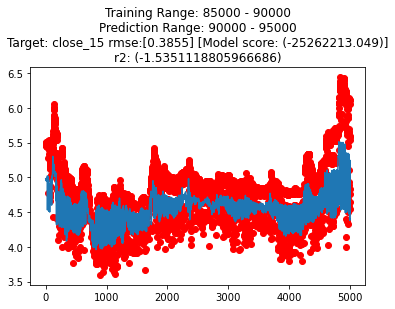

Regressing
Complete: 3.31s


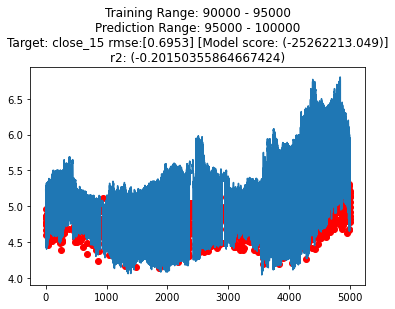

Regressing
Complete: 7.65s


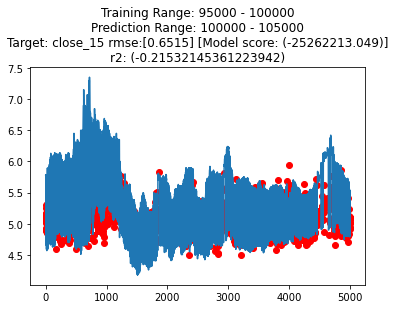

Regressing
Complete: 6.42s


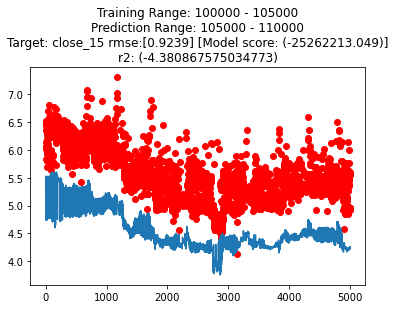

Regressing
Complete: 3.35s


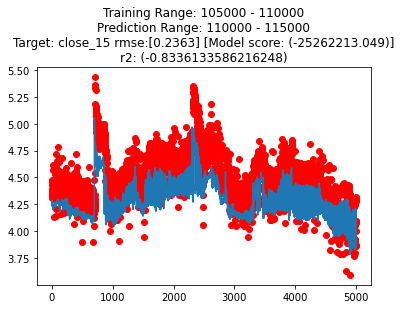

Regressing
Complete: 2.45s


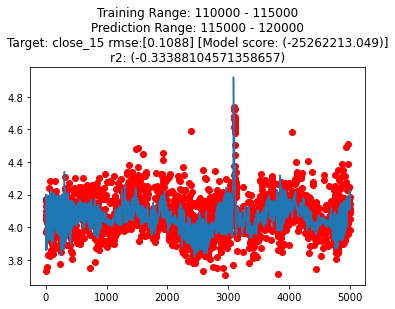

Regressing
Complete: 2.44s


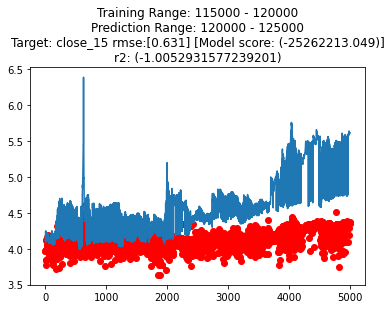

Regressing
Complete: 3.61s


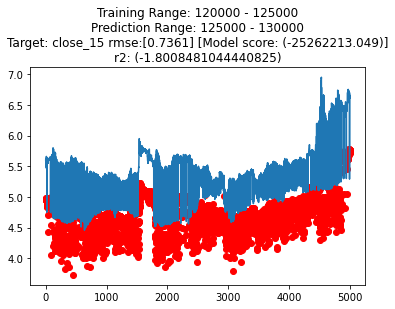

Regressing
Complete: 7.99s


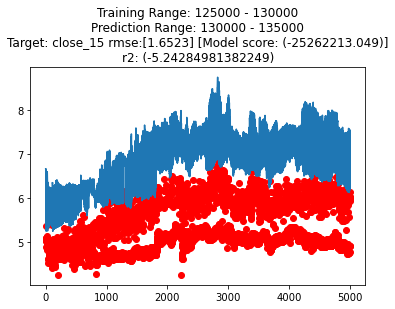

Regressing
Complete: 5.18s


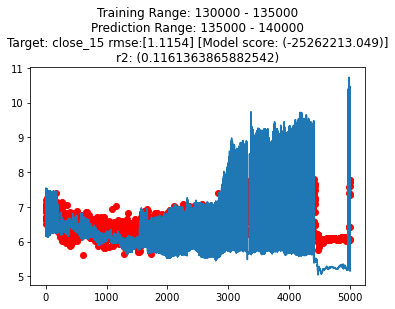

Regressing
Complete: 6.48s


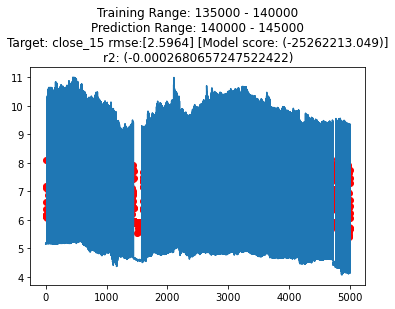

Regressing
Complete: 6.99s


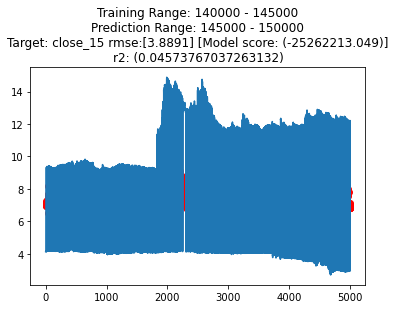

Regressing
Complete: 49.79s


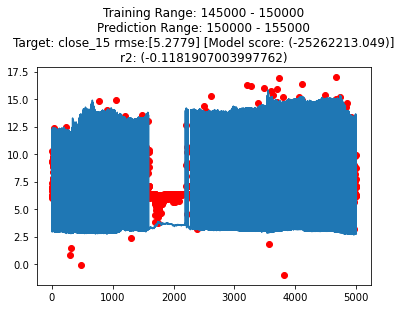

Regressing
Complete: 6.41s


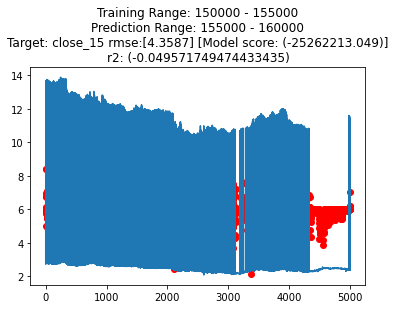

Regressing
Complete: 20.31s


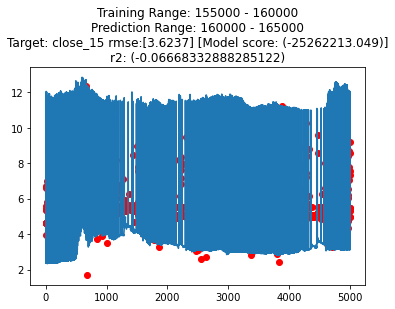

Regressing
Complete: 15.24s


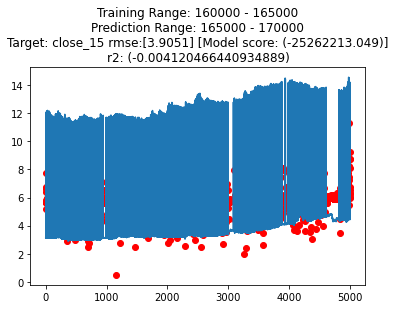

Regressing
Complete: 8.9s


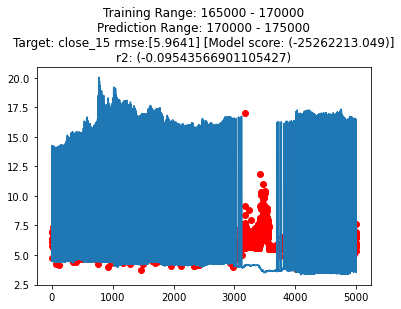

Regressing
Complete: 8.17s


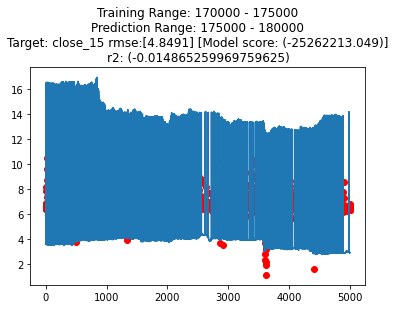

Regressing
Complete: 8.61s


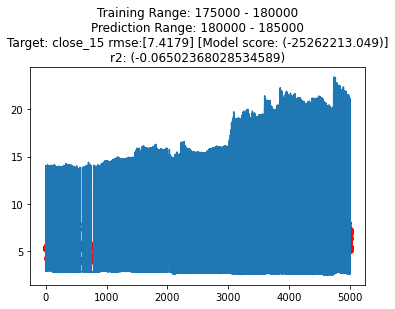

Regressing
Complete: 11.76s


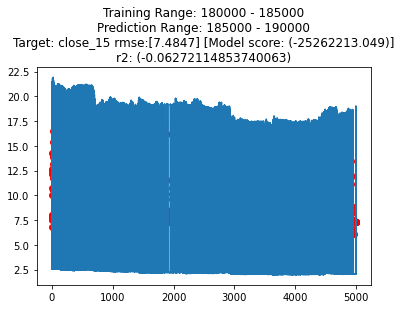

Regressing
Complete: 13.13s


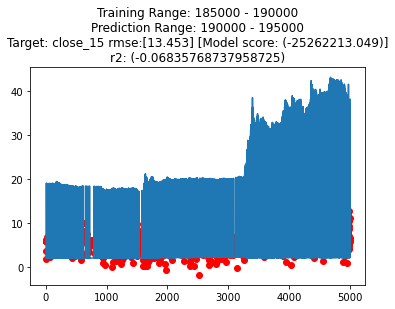

Regressing
Complete: 24.81s


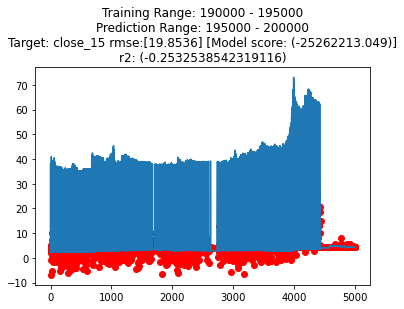

Regressing
Complete: 12.81s


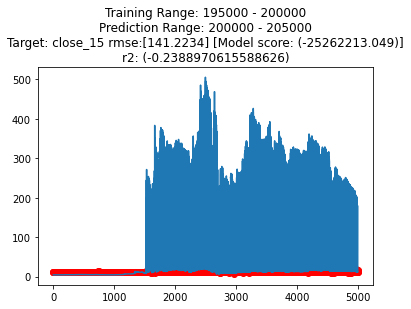

Regressing
Complete: 24.4s


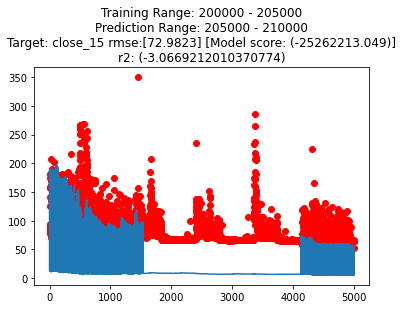

Regressing
Complete: 45.97s


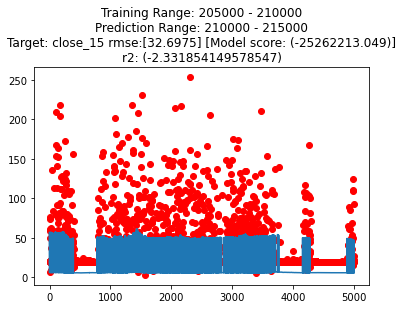

Regressing
Complete: 6.52s


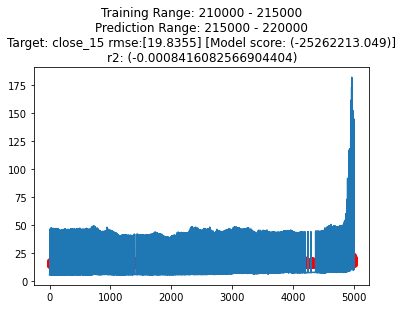

Regressing
Complete: 8.31s


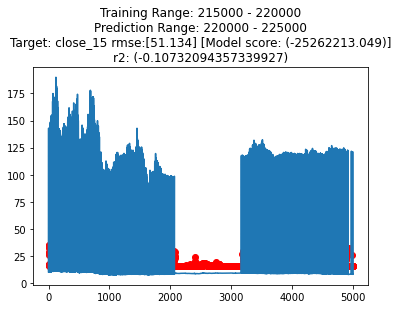

Regressing
Complete: 7.98s


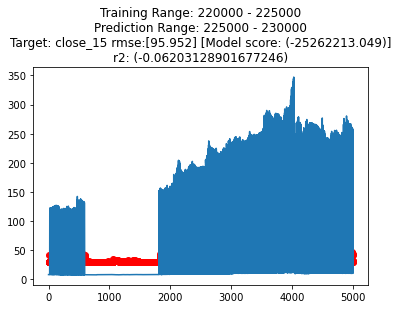

Regressing
Complete: 26.49s


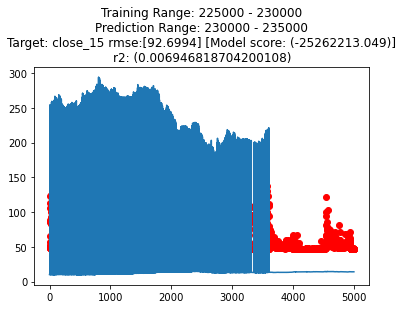

Regressing
Complete: 26.02s


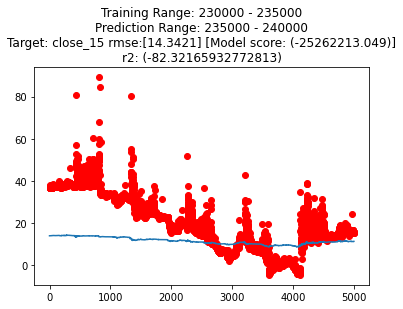

Regressing
Complete: 7.01s


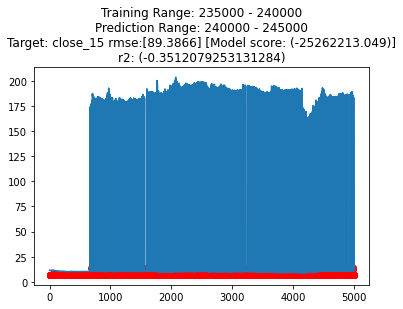

Regressing
Complete: 9.0s


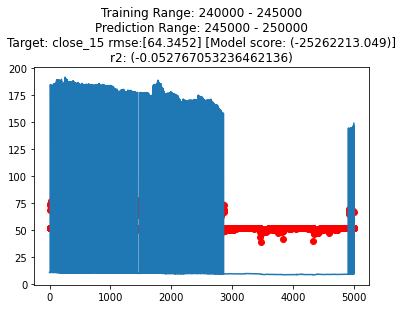

Regressing
Complete: 16.02s


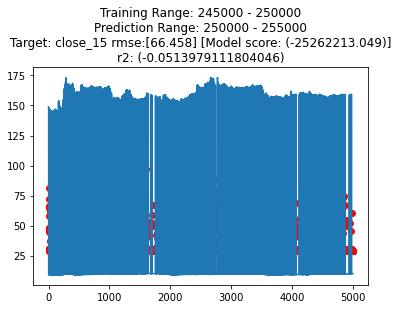

Regressing
Complete: 21.06s


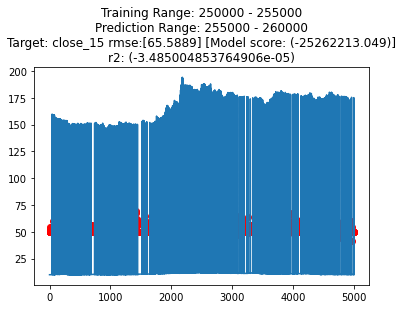

Regressing
Complete: 21.04s


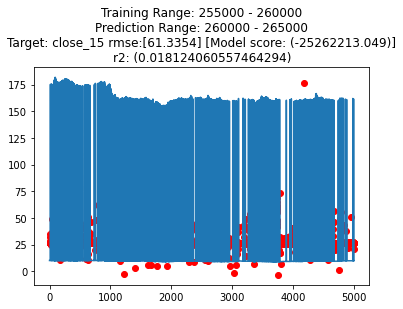

Regressing
Complete: 20.44s


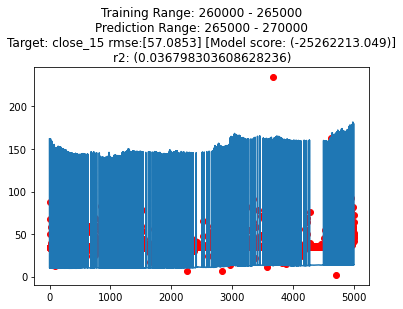

Regressing
Complete: 19.13s


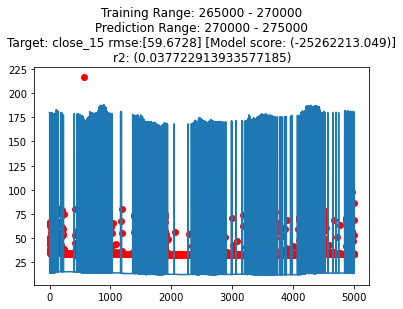

Regressing
Complete: 18.34s


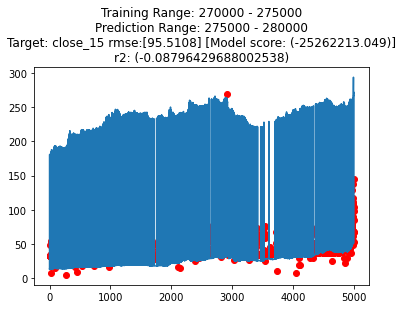

Regressing
Complete: 21.08s


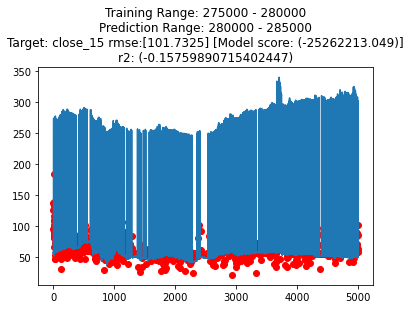

Regressing
Complete: 25.77s


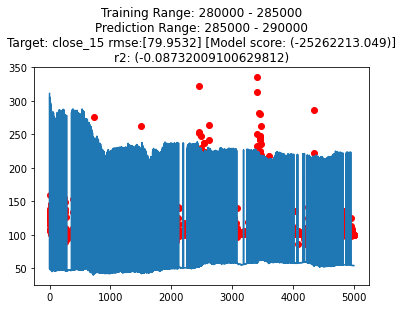

Regressing
Complete: 22.48s


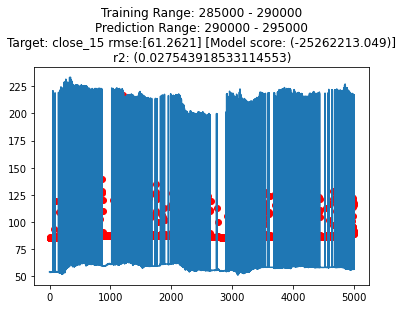

Regressing
Complete: 13.63s


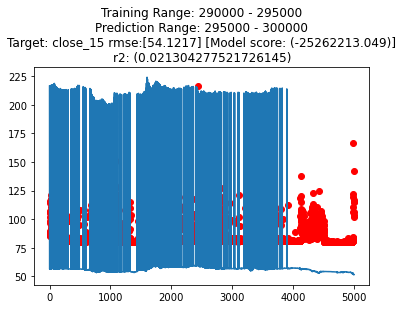

Regressing
Complete: 25.06s


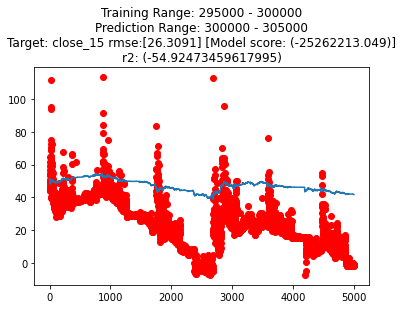

Regressing
Complete: 4.58s


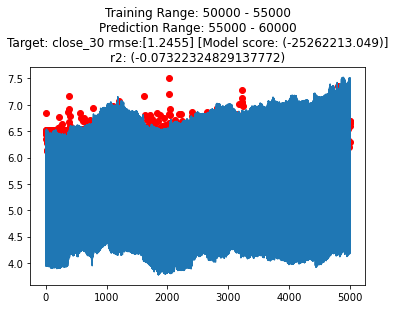

Regressing
Complete: 3.16s


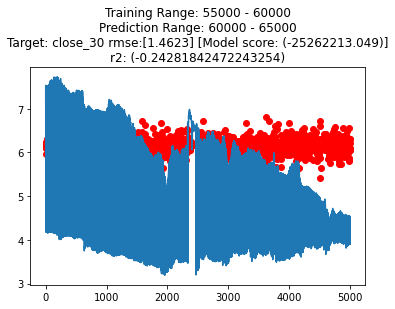

Regressing
Complete: 9.05s


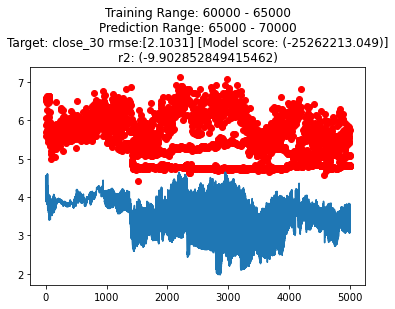

Regressing
Complete: 7.01s


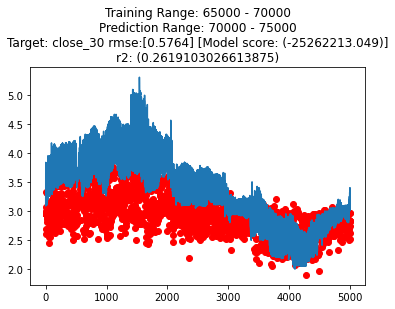

Regressing
Complete: 5.8s


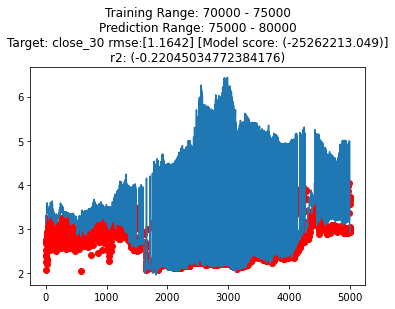

Regressing
Complete: 7.96s


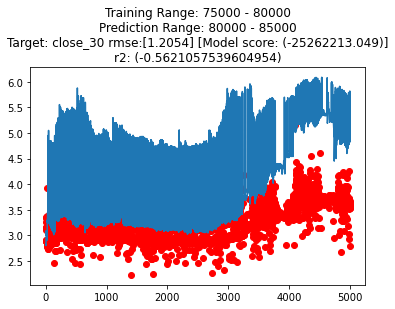

Regressing
Complete: 8.87s


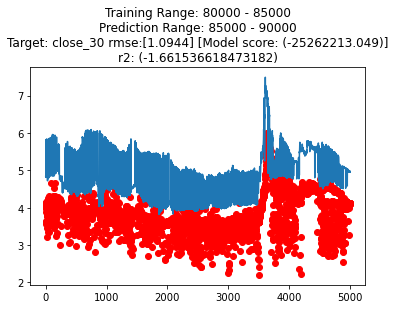

Regressing
Complete: 5.68s


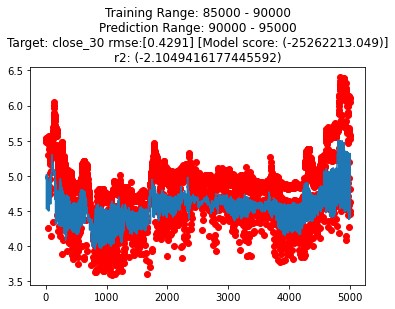

Regressing
Complete: 3.36s


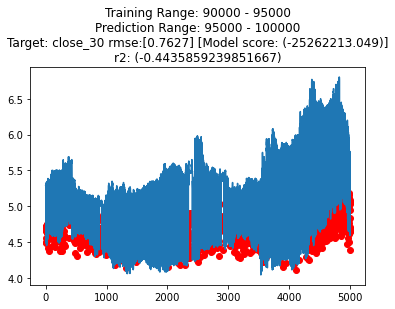

Regressing
Complete: 8.2s


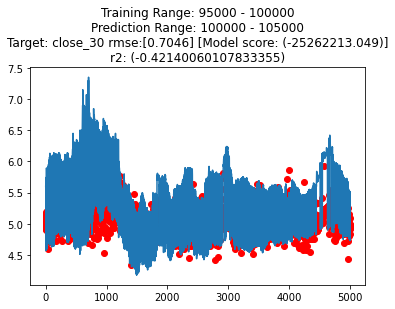

Regressing
Complete: 8.69s


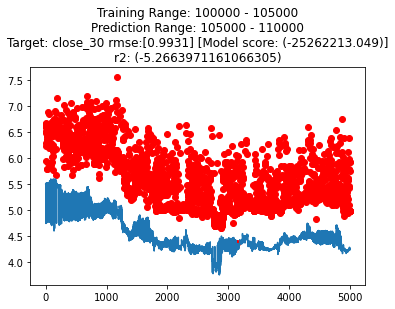

Regressing
Complete: 4.19s


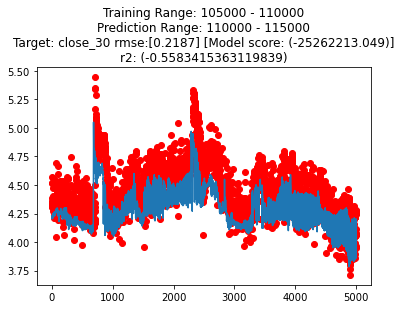

Regressing
Complete: 2.89s


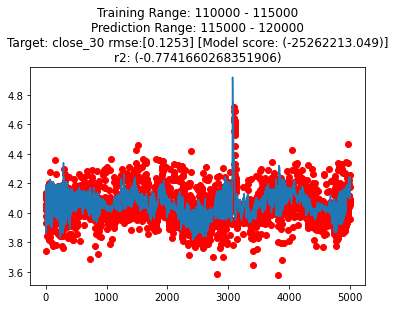

Regressing
Complete: 2.19s


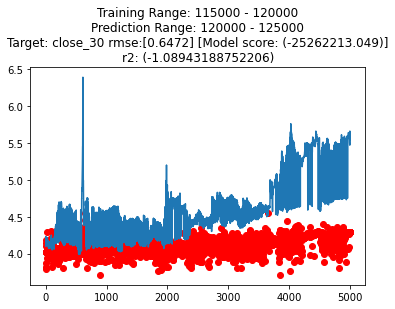

Regressing
Complete: 5.44s


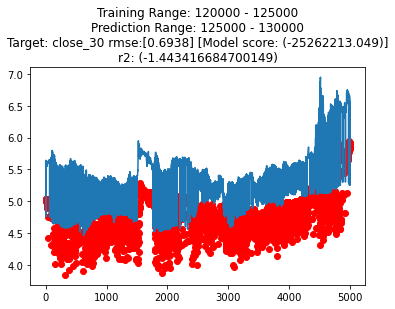

Regressing
Complete: 4.75s


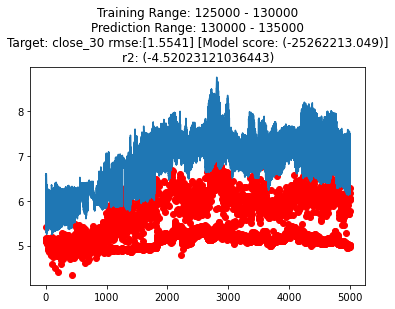

Regressing
Complete: 6.17s


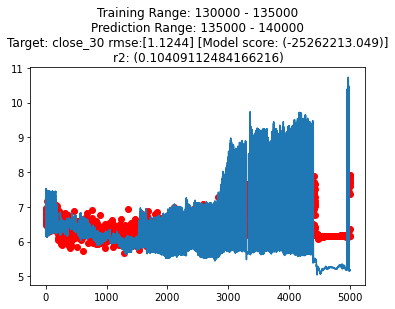

Regressing
Complete: 7.11s


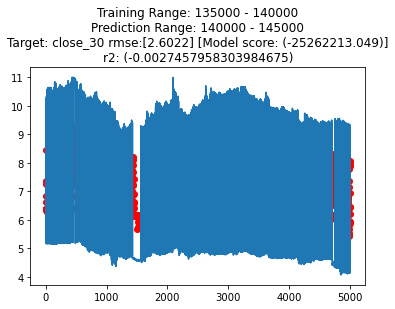

Regressing
Complete: 5.59s


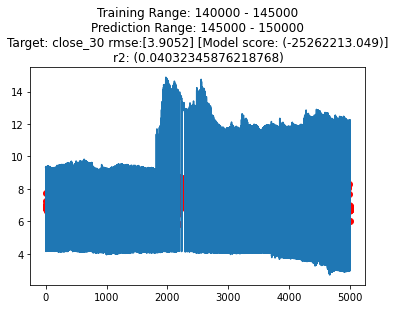

Regressing
Complete: 13.92s


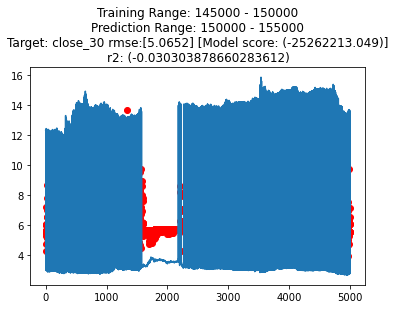

Regressing
Complete: 12.74s


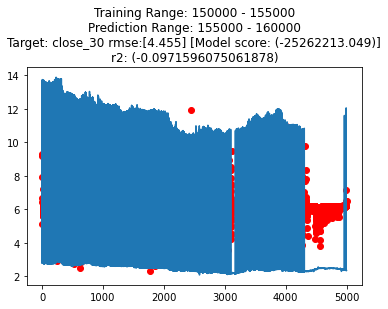

Regressing
Complete: 2.77s


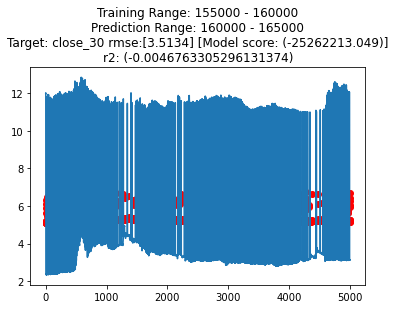

Regressing
Complete: 8.55s


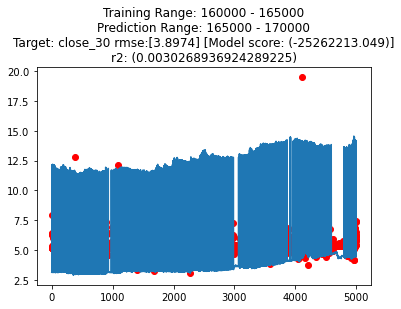

Regressing
Complete: 7.95s


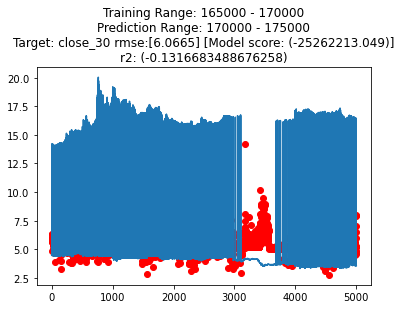

Regressing
Complete: 10.01s


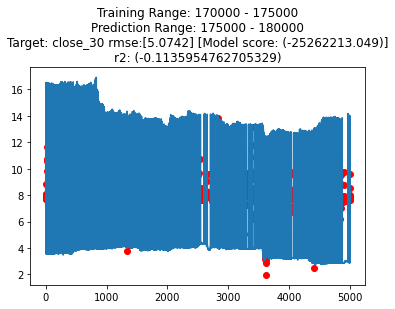

Regressing
Complete: 7.46s


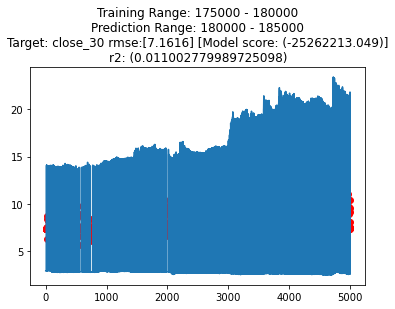

Regressing
Complete: 32.32s


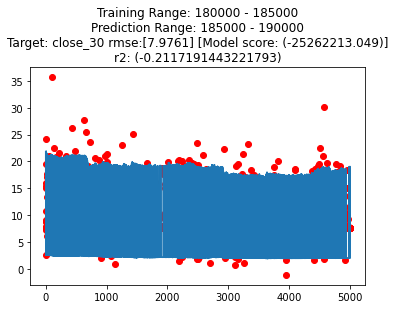

Regressing
Complete: 8.71s


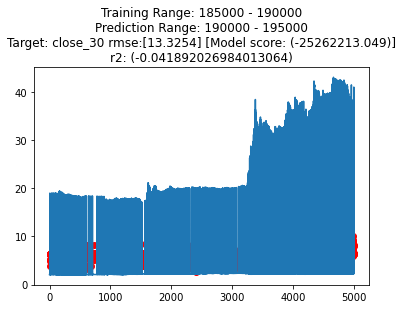

Regressing
Complete: 7.79s


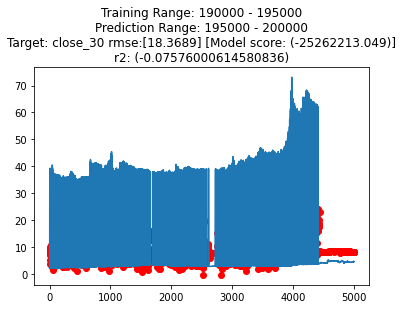

Regressing
Complete: 12.59s


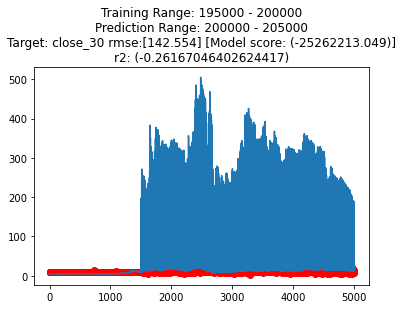

Regressing
Complete: 27.91s


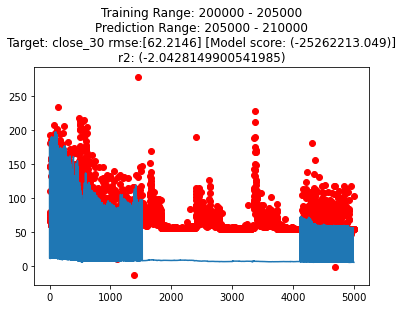

Regressing
Complete: 16.21s


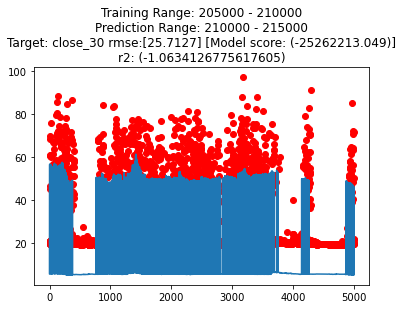

Regressing
Complete: 11.68s


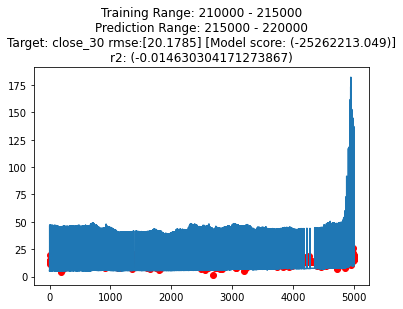

Regressing
Complete: 15.48s


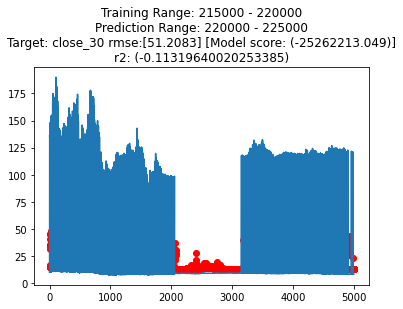

Regressing
Complete: 11.93s


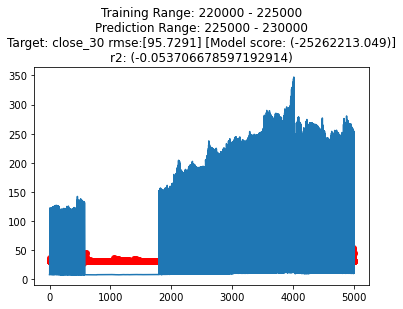

Regressing
Complete: 20.86s


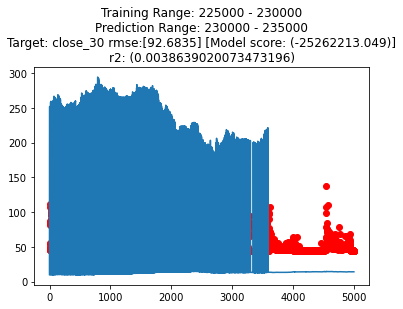

Regressing
Complete: 21.58s


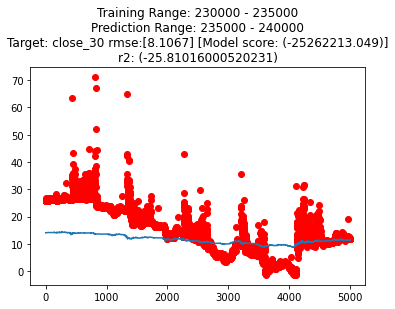

Regressing
Complete: 8.21s


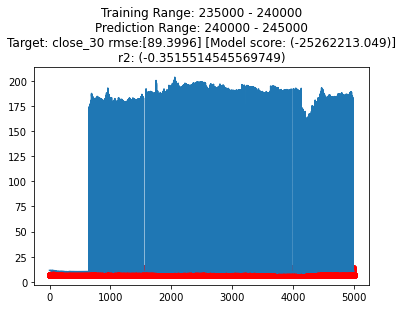

Regressing
Complete: 24.01s


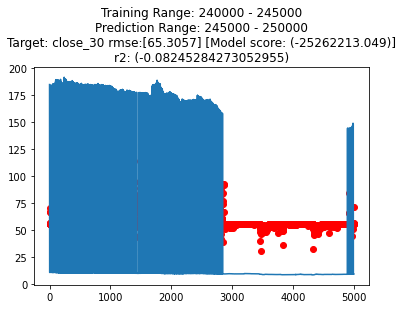

Regressing
Complete: 20.16s


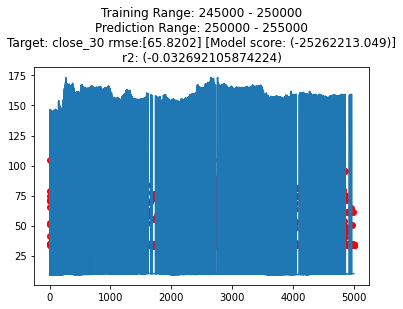

Regressing
Complete: 21.0s


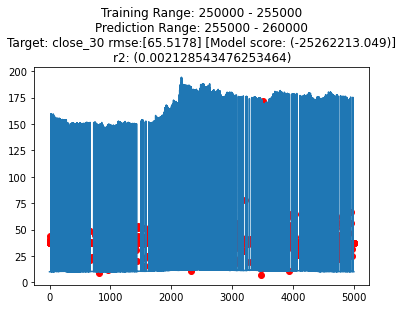

Regressing
Complete: 25.93s


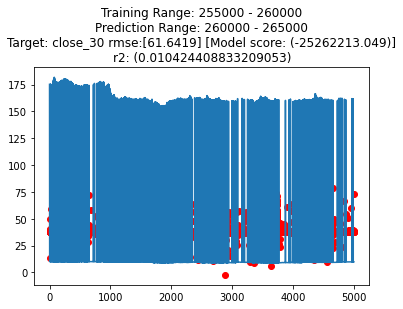

Regressing
Complete: 27.84s


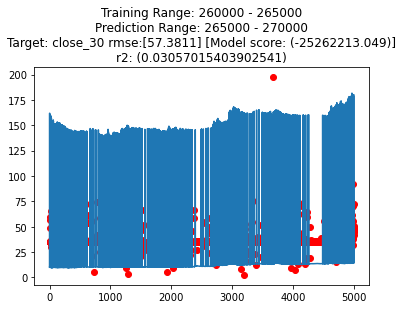

Regressing
Complete: 23.15s


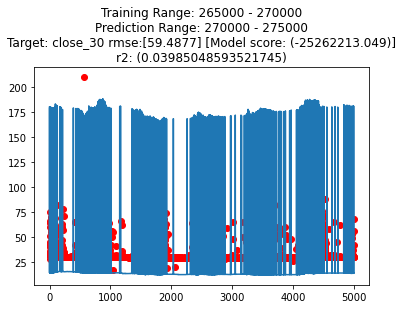

Regressing
Complete: 21.91s


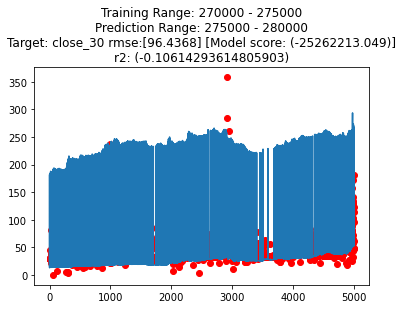

Regressing
Complete: 21.7s


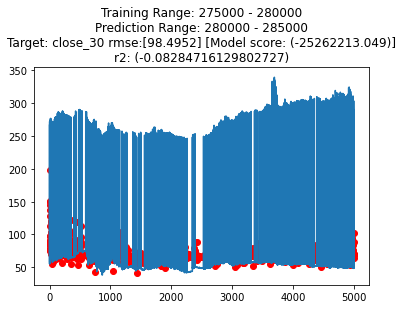

Regressing
Complete: 32.19s


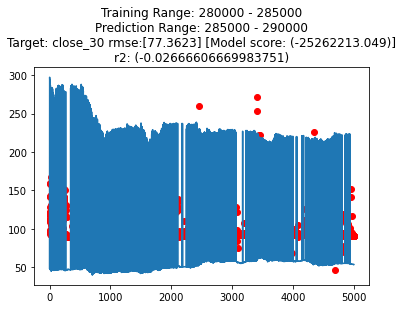

Regressing
Complete: 27.33s


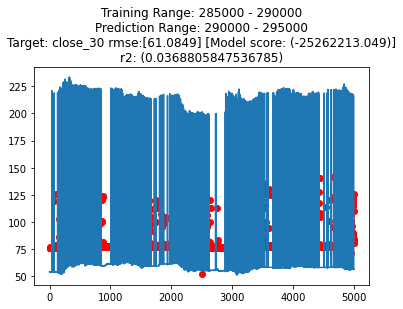

Regressing
Complete: 28.35s


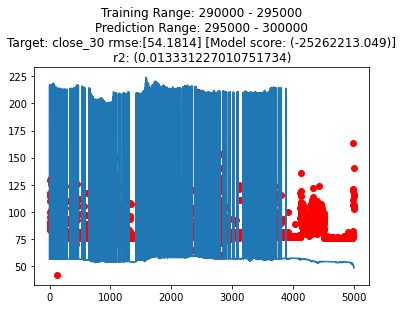

Regressing
Complete: 28.94s


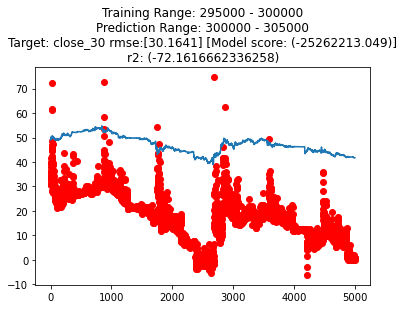

Regressing
Complete: 6.26s


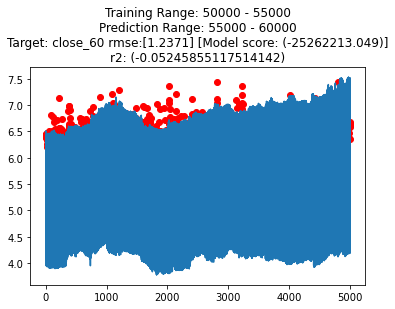

Regressing
Complete: 4.75s


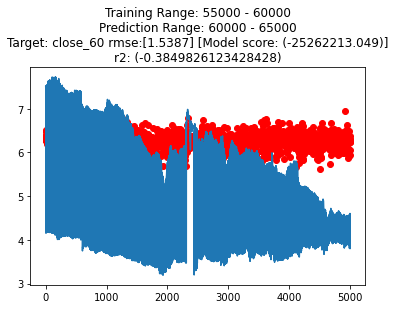

Regressing
Complete: 9.54s


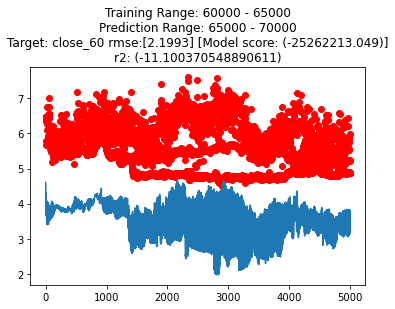

Regressing
Complete: 5.38s


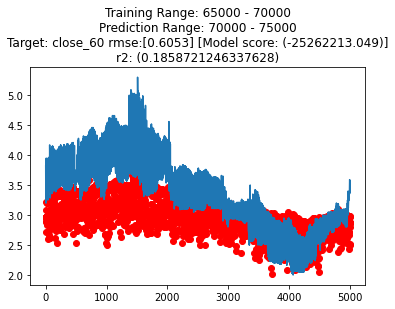

Regressing
Complete: 11.65s


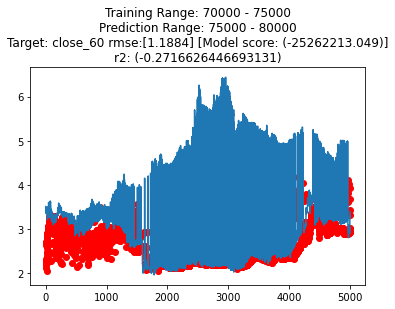

Regressing
Complete: 6.23s


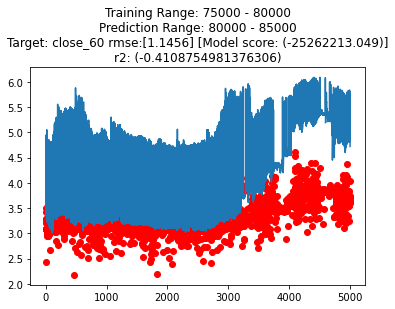

Regressing
Complete: 10.83s


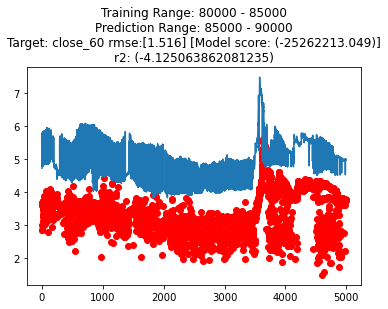

Regressing
Complete: 4.73s


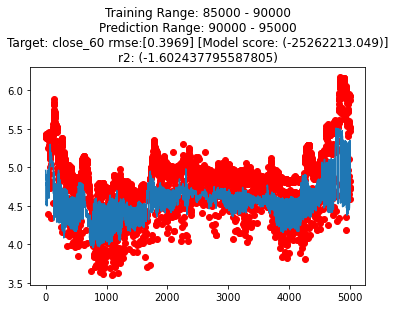

Regressing
Complete: 5.94s


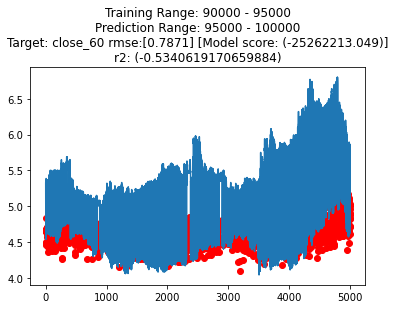

Regressing
Complete: 4.95s


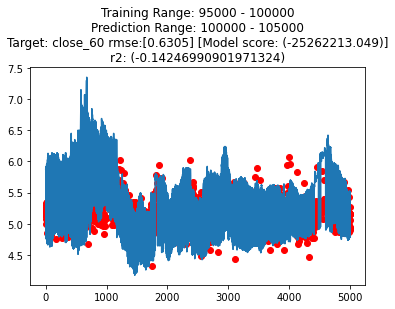

Regressing
Complete: 8.44s


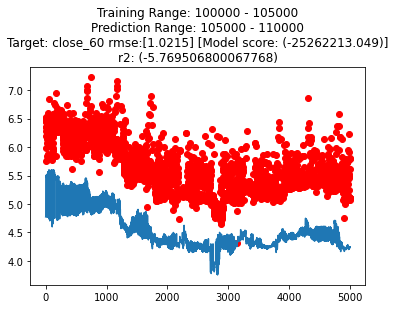

Regressing
Complete: 3.97s


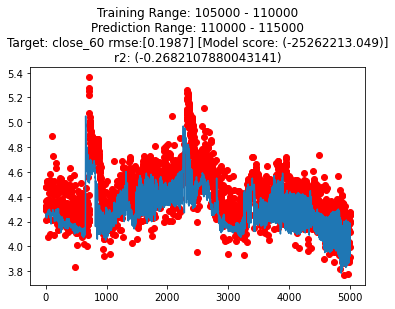

Regressing
Complete: 4.28s


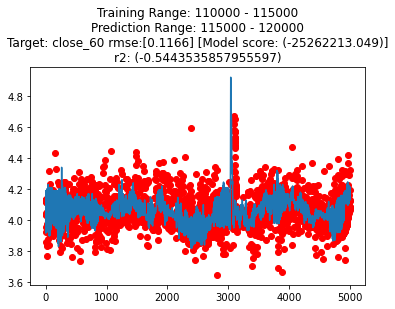

Regressing
Complete: 1.1s


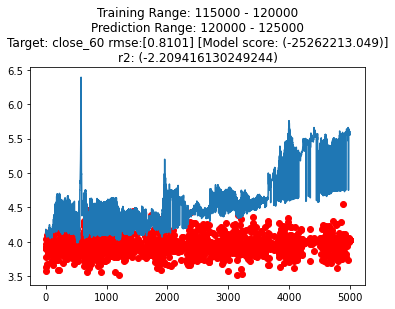

Regressing
Complete: 11.25s


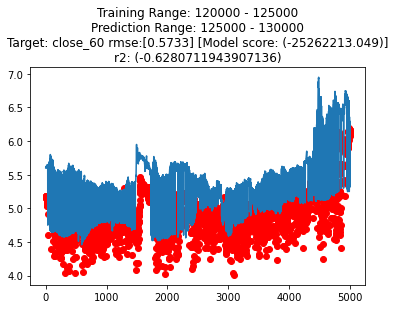

Regressing
Complete: 9.82s


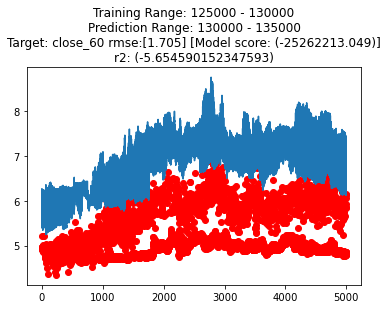

Regressing
Complete: 8.38s


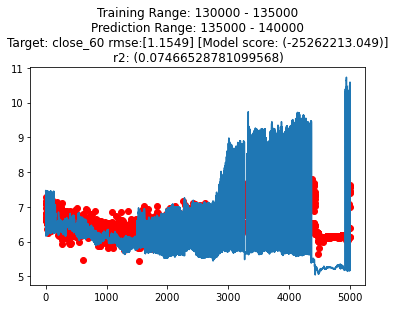

Regressing
Complete: 7.24s


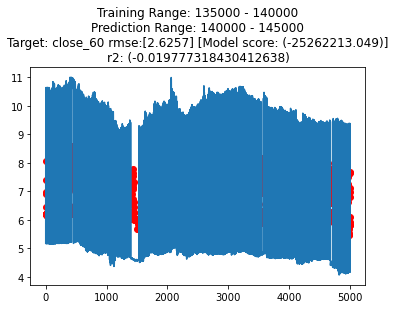

Regressing
Complete: 5.4s


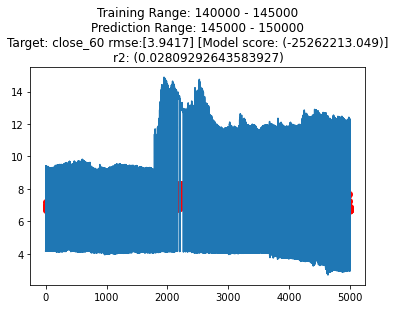

Regressing
Complete: 10.61s


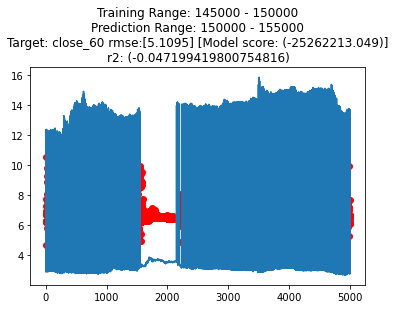

Regressing
Complete: 2.9s


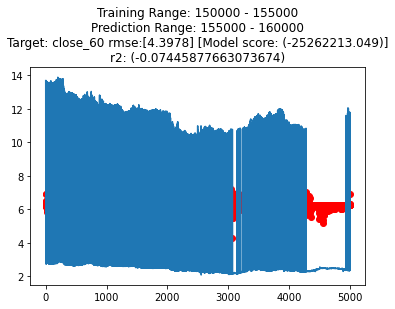

Regressing
Complete: 5.42s


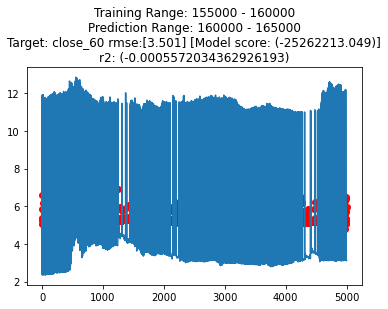

Regressing
Complete: 6.21s


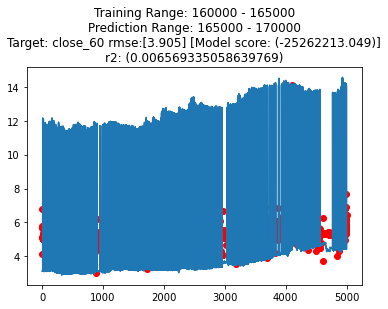

Regressing
Complete: 11.9s


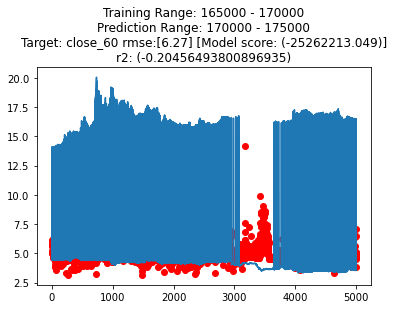

Regressing
Complete: 28.47s


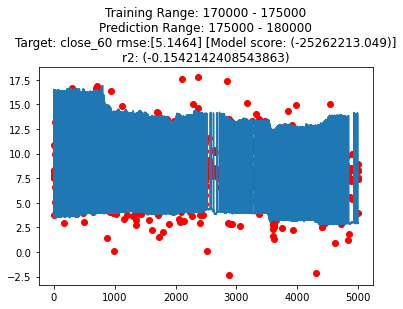

Regressing
Complete: 11.52s


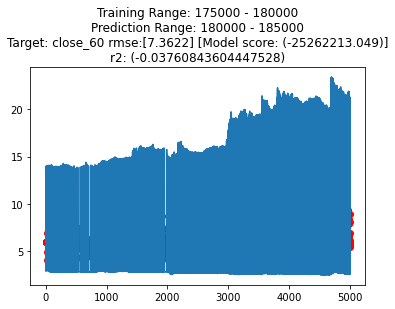

Regressing
Complete: 6.58s


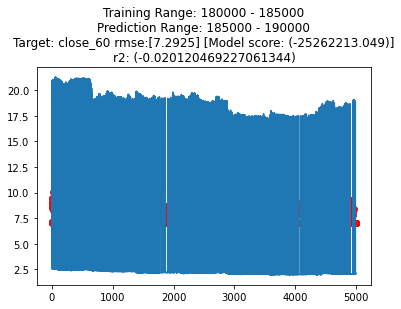

Regressing
Complete: 8.57s


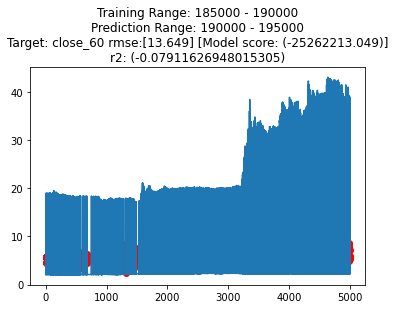

Regressing
Complete: 21.13s


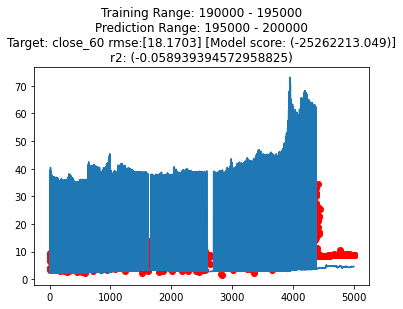

Regressing
Complete: 12.45s


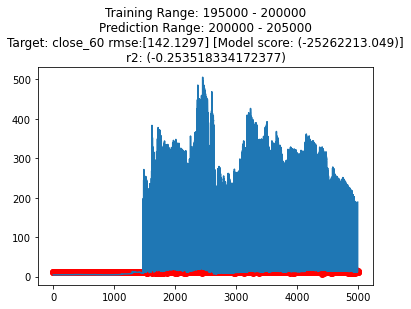

Regressing
Complete: 38.11s


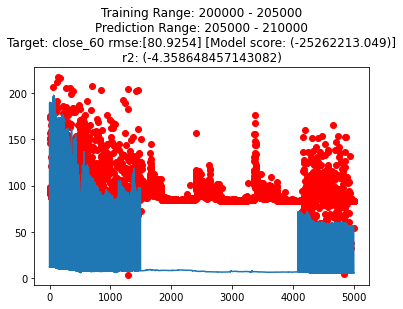

Regressing
Complete: 15.76s


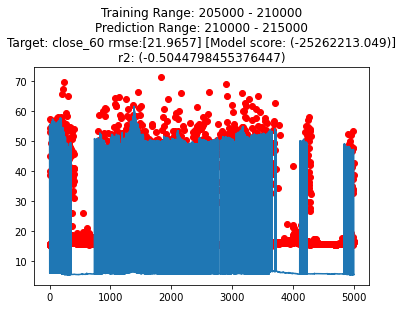

Regressing
Complete: 14.8s


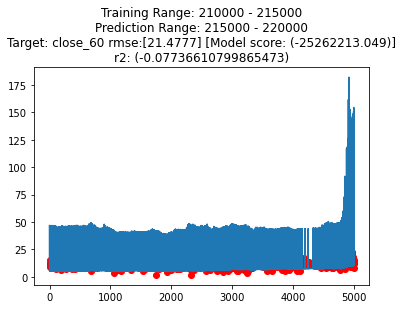

Regressing
Complete: 12.94s


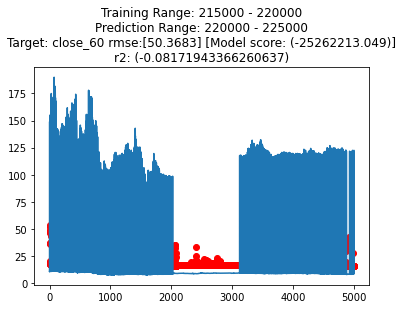

Regressing
Complete: 21.46s


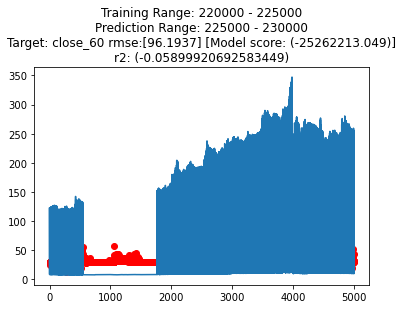

Regressing
Complete: 21.3s


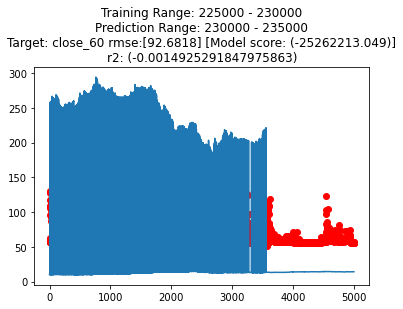

Regressing
Complete: 21.01s


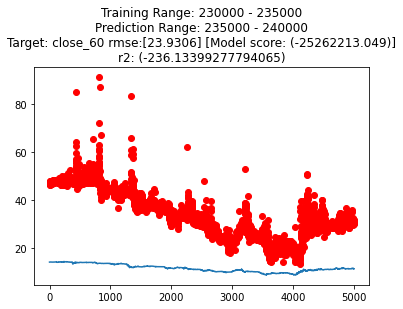

Regressing
Complete: 7.92s


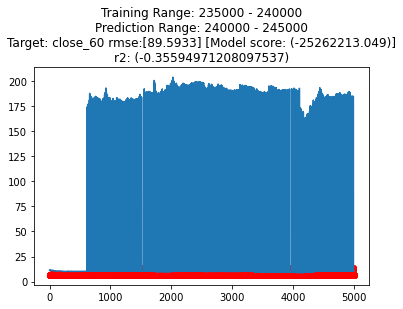

Regressing
Complete: 11.95s


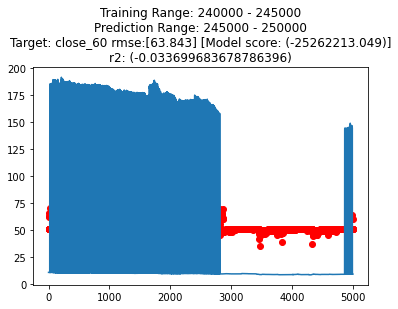

Regressing
Complete: 21.82s


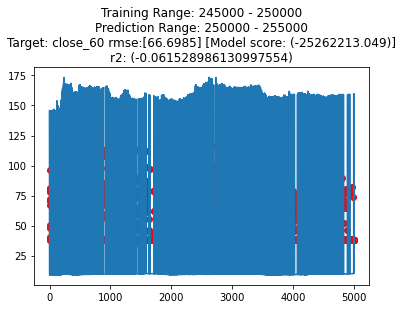

Regressing
Complete: 26.66s


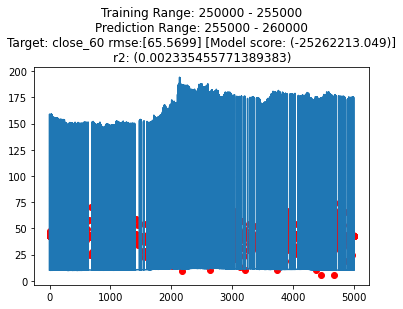

Regressing
Complete: 25.44s


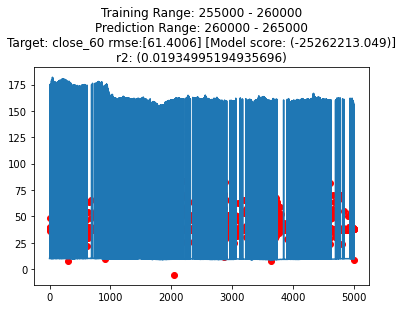

Regressing
Complete: 22.93s


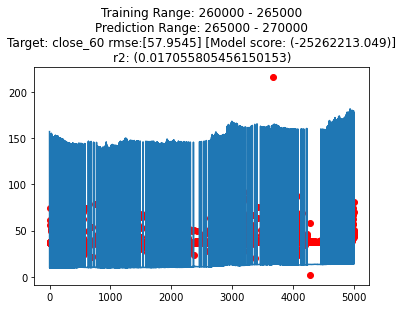

Regressing
Complete: 25.09s


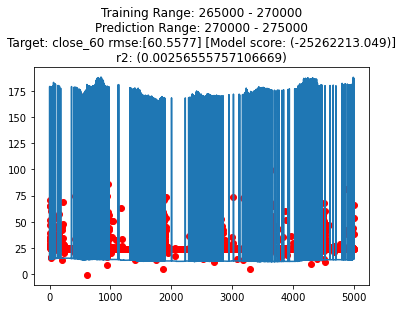

Regressing
Complete: 25.34s


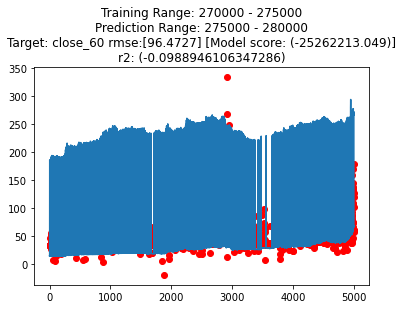

Regressing
Complete: 20.56s


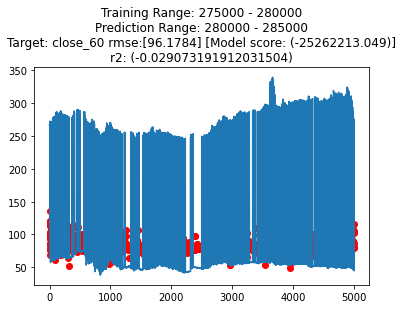

Regressing
Complete: 24.85s


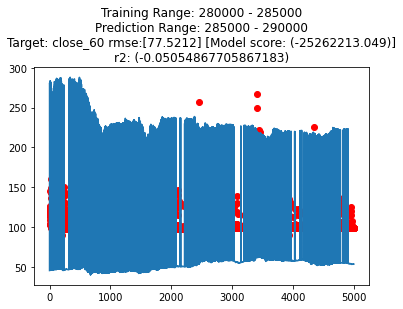

Regressing
Complete: 17.89s


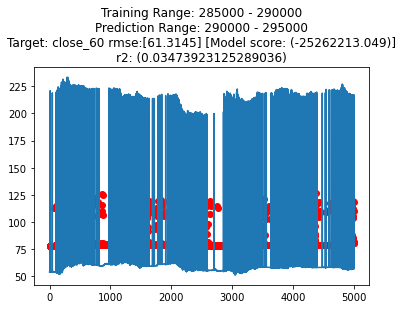

Regressing
Complete: 26.58s


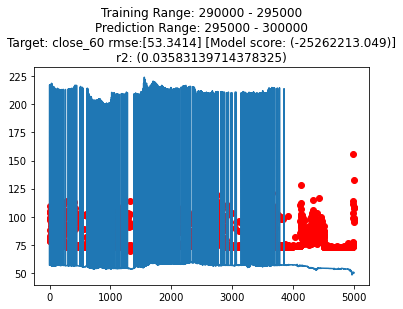

Regressing
Complete: 23.65s


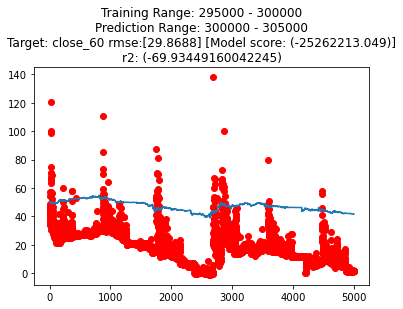

Regressing
Complete: 13.6s


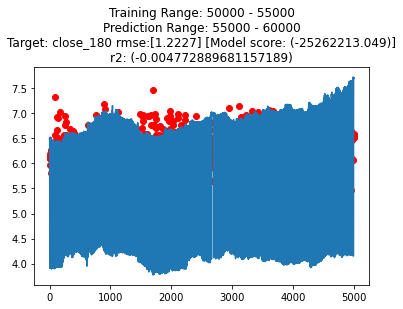

Regressing
Complete: 1.66s


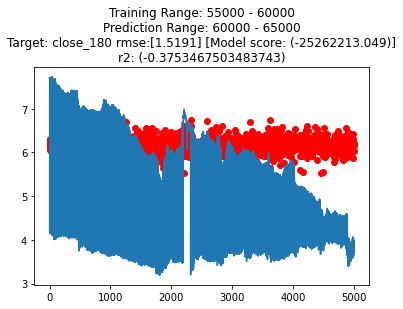

Regressing
Complete: 11.61s


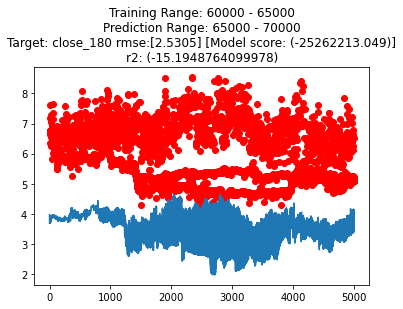

Regressing
Complete: 5.8s


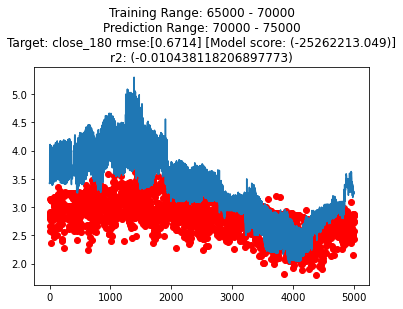

Regressing
Complete: 9.46s


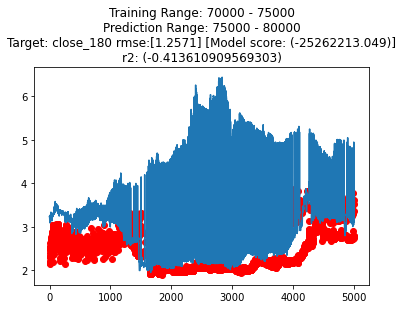

Regressing
Complete: 5.19s


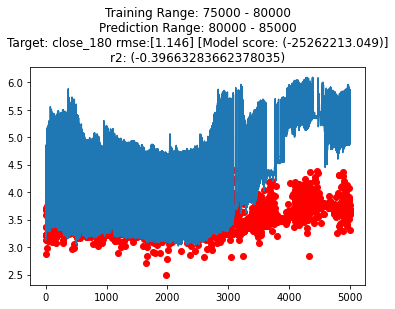

Regressing
Complete: 8.27s


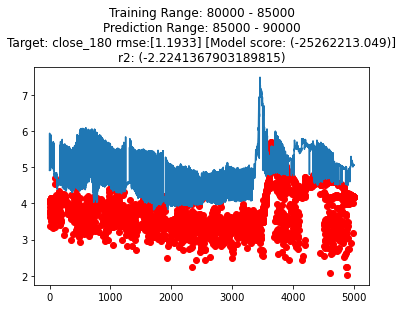

Regressing
Complete: 4.05s


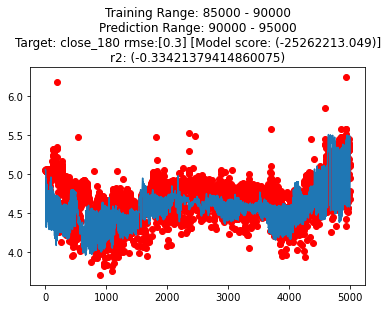

Regressing
Complete: 5.35s


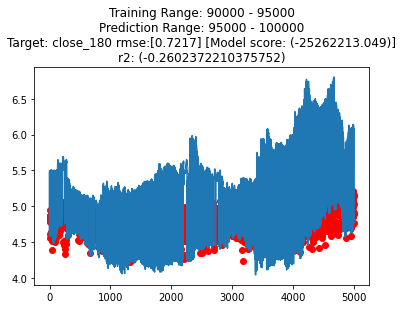

Regressing
Complete: 6.74s


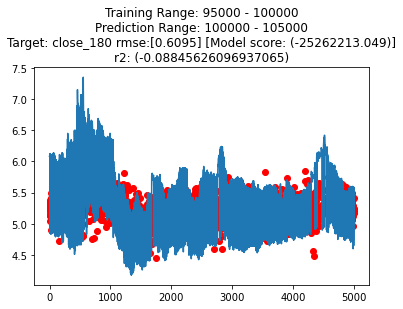

Regressing
Complete: 5.82s


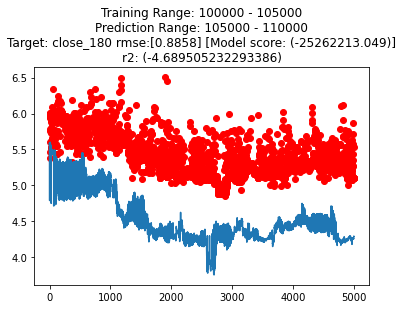

Regressing
Complete: 4.5s


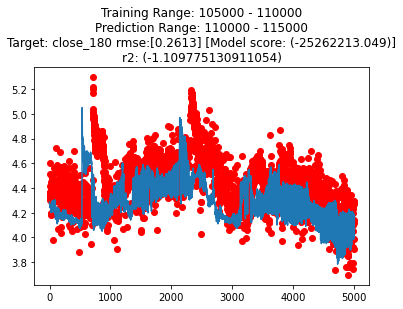

Regressing
Complete: 1.07s


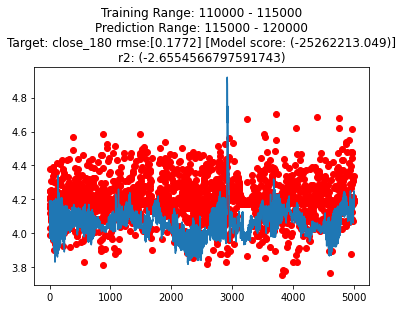

Regressing
Complete: 2.02s


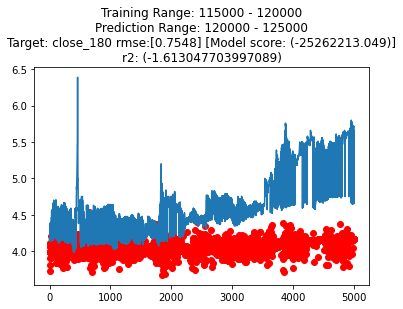

Regressing
Complete: 6.49s


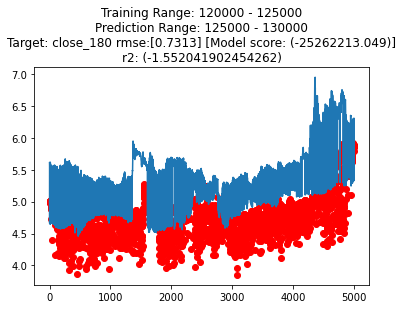

Regressing
Complete: 8.08s


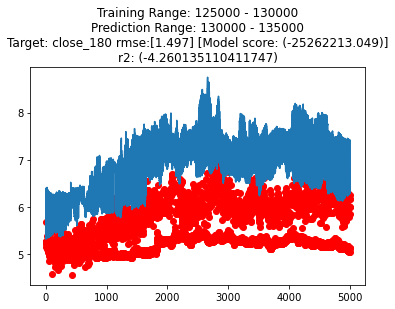

Regressing
Complete: 6.24s


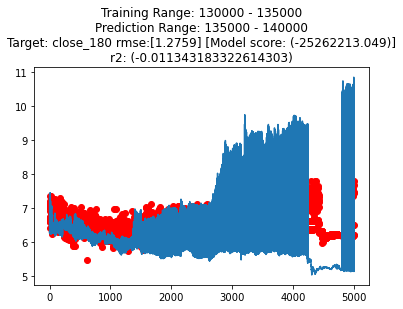

Regressing
Complete: 5.53s


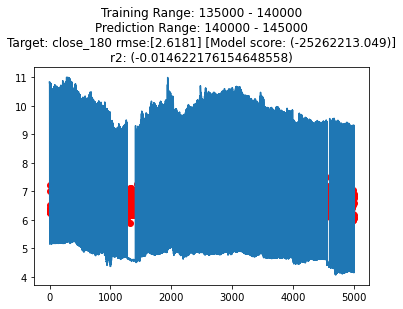

Regressing
Complete: 8.83s


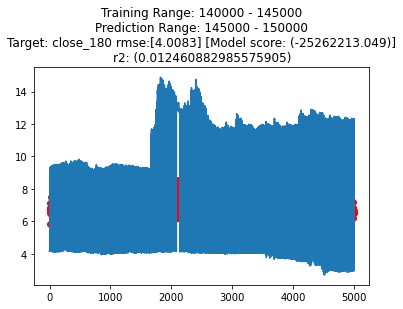

Regressing
Complete: 5.45s


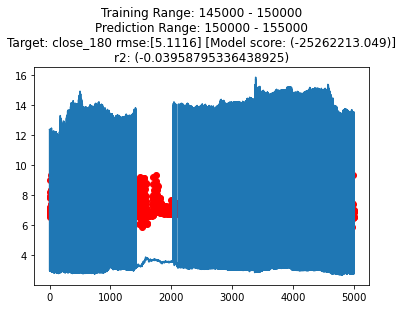

Regressing
Complete: 8.6s


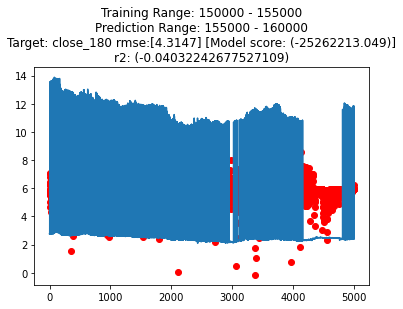

Regressing
Complete: 9.77s


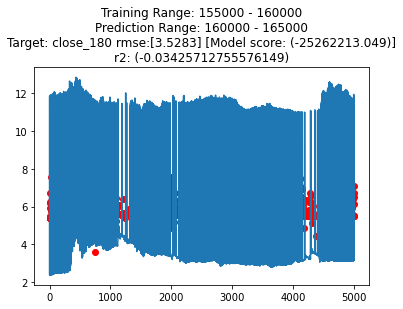

Regressing
Complete: 4.58s


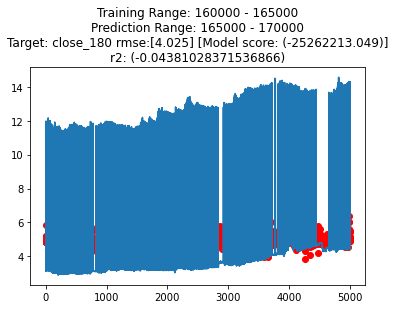

Regressing
Complete: 9.93s


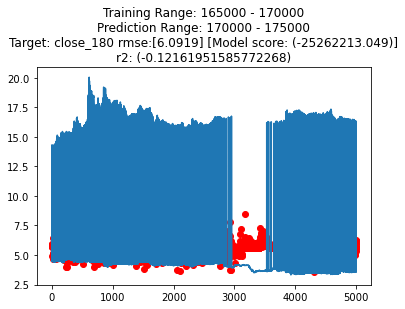

Regressing
Complete: 17.32s


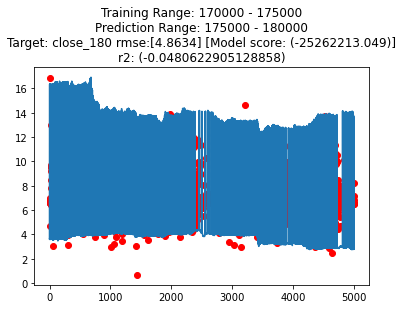

Regressing
Complete: 3.75s


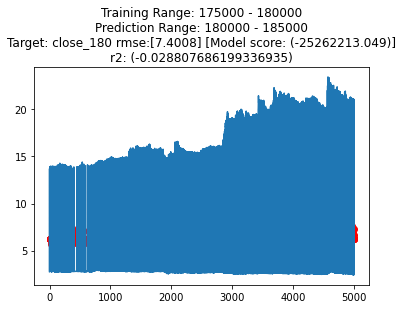

Regressing
Complete: 9.4s


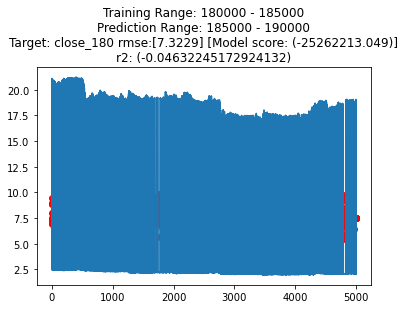

Regressing
Complete: 40.57s


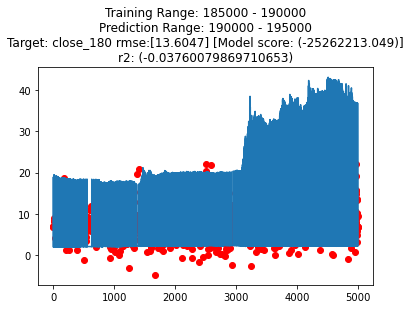

Regressing
Complete: 68.69s


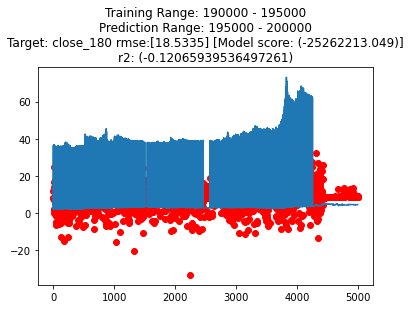

Regressing
Complete: 8.12s


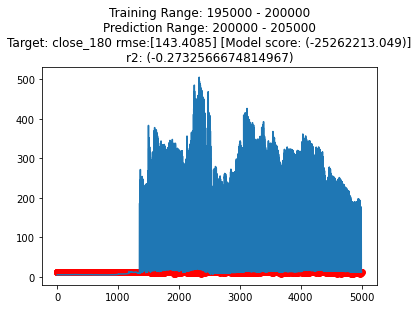

Regressing
Complete: 14.93s


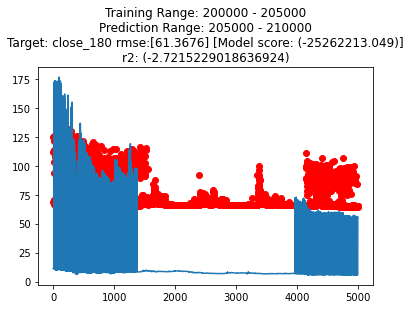

Regressing
Complete: 23.83s


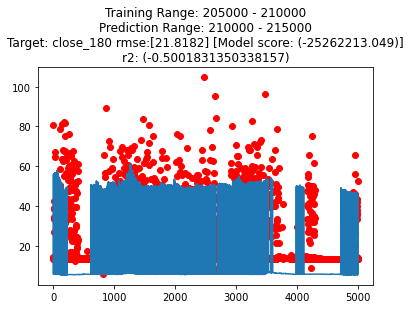

Regressing
Complete: 12.79s


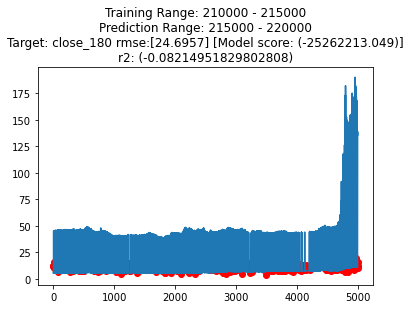

Regressing
Complete: 9.57s


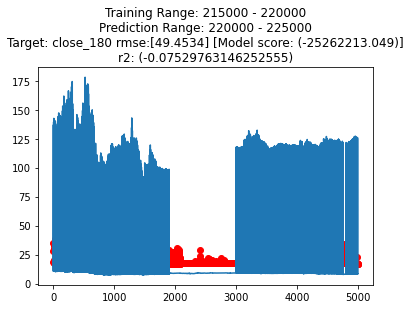

Regressing
Complete: 18.29s


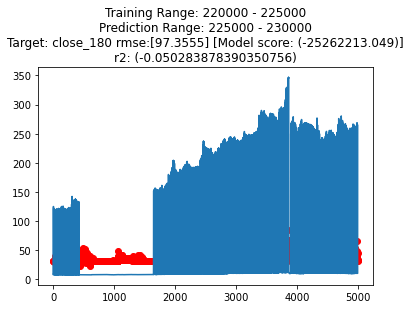

Regressing
Complete: 24.01s


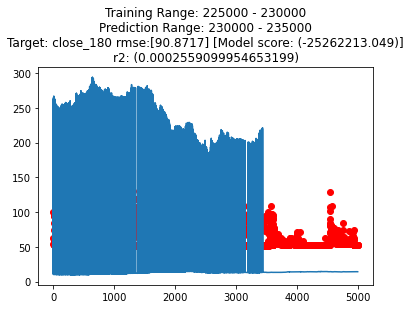

Regressing
Complete: 33.54s


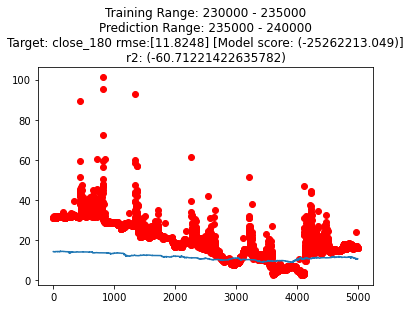

Regressing
Complete: 18.79s


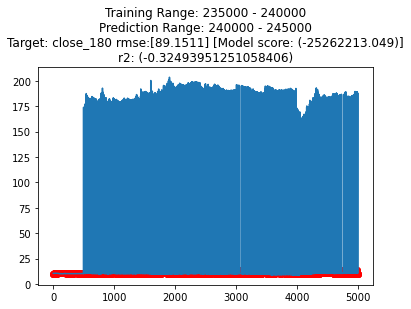

Regressing
Complete: 32.71s


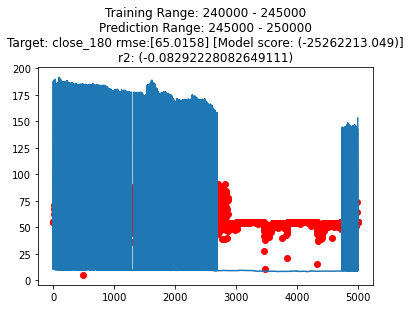

Regressing
Complete: 16.57s


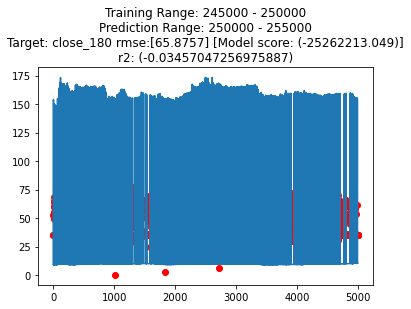

Regressing
Complete: 16.73s


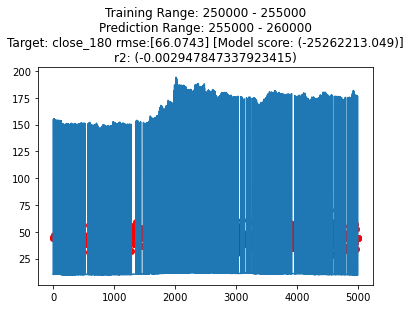

Regressing
Complete: 16.84s


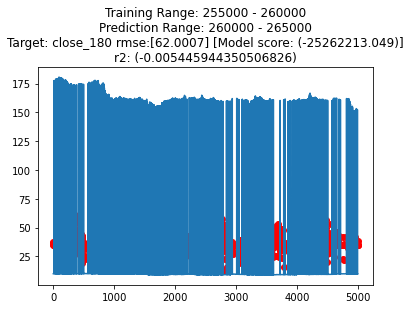

Regressing
Complete: 20.98s


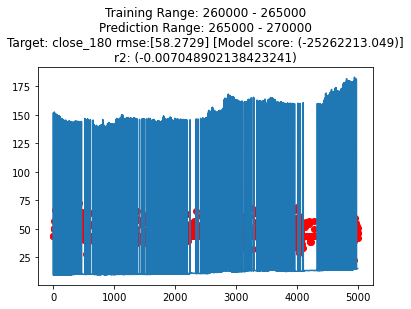

Regressing
Complete: 15.66s


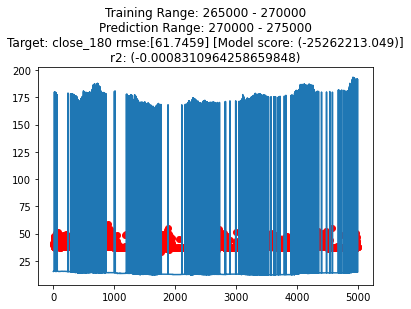

Regressing
Complete: 4.88s


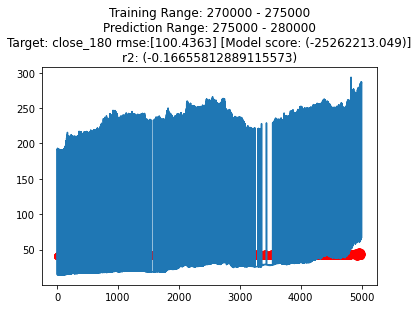

Regressing
Complete: 30.32s


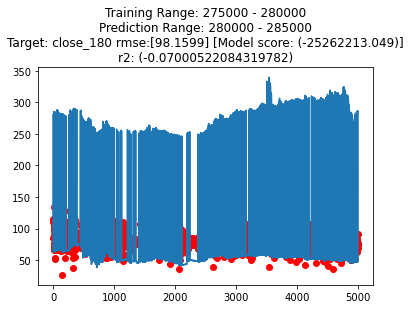

Regressing
Complete: 19.42s


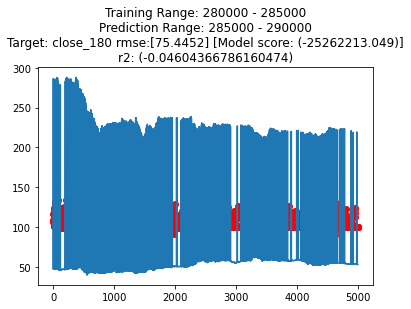

Regressing
Complete: 26.08s


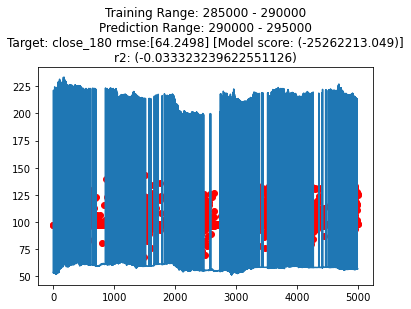

Regressing
Complete: 24.17s


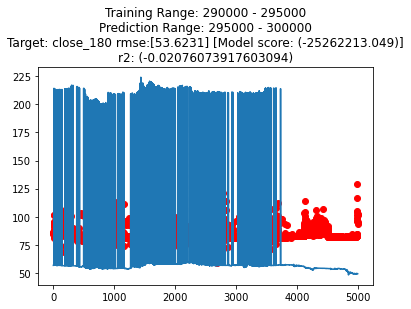

Regressing


ValueError: Input contains NaN, infinity or a value too large for dtype('float64').

In [61]:
#//*** Pick start and end iLoc for training
predictions_in_advance = 5000
training_range = 5000

#//*** Loop through each of the target variables
for tgt_col in df.columns[7:17]:
    
    #//*** Model progressive slices of the data
    for x in range(10,60):
        
        #//*** Training start is counter * the training range
        train_start = x * training_range

        #//*** End Training at start + range
        train_end   = train_start + training_range
        
        #//*** Target Column
        predict_col = tgt_col

        #//*** Build Training set from start iloc to end iloc
        x_train = df[train_cols][train_start:train_end]
        y_train = df[predict_col][train_start:train_end]

        #//*** Build Test set from Training End + predictions_in_advace
        x_test = df[train_cols][train_end:train_end + predictions_in_advance]
        y_test = df[predict_col][train_end:train_end + predictions_in_advance]

        #//*** Scale the training data
        scaler = MinMaxScaler()
        x_train_norm = scaler.fit_transform(x_train)
        x_test_norm = scaler.fit_transform(x_test)

        start_time = time.time()
        print("Regressing")
        
        #//*** Fit the regressor
        regr = MLPRegressor(max_iter=5000).fit(x_train_norm,y_train)

        #score = regr.score(x_train, y_train)
        
        #//*** Generate Predictions
        result = regr.predict(x_test_norm)

        #//*** Mean Squared error
        mse = mean_squared_error(y_test, result)

        #//*** These are values to be added to results_df
        target = predict_col
        
        #//*** Root Mean squared Error
        rmse = sqrt(mse)
        #//*** r2 score for model evaluation
        r2 = r2_score(y_test,result)
        start = train_start
        end = train_end
        predict_range = training_range
        model_time = round(time.time()-start_time,2)
        print(f"Complete: {model_time}s" )
        actual = y_test
        predict = result

        #//*** Update Results_df
        results_df.loc[len(results_df)] = [target,rmse,r2,start,end,predict_range,model_time,actual,predict]

        #//*** PLot Results
        fig,ax = plt.subplots()
        plot_x = np.arange(len(y_test))
        ax.plot(plot_x,y_test )
        ax.scatter(plot_x,result,color='red' )

        title= ""
        title+=f"Training Range: {train_start} - {train_end}\n"
        title+=f"Prediction Range: {train_end} - {train_end + predictions_in_advance}\n"
        title+=f"Target: {predict_col} rmse:[{round(rmse,4)}] [Model score: ({round(score,4)})]\nr2: ({r2})"
        plt.title(title)    
        plt.show()
results_df

In [63]:
results_df.to_pickle('./results/results_amc_1min_MLPRegressor_v1.pkl.zip')